In [2]:
import os
import pandas as pd
import numpy as np

In [3]:
import matplotlib.pyplot as plt
import random
import matplotlib
from itertools import combinations
from collections import Counter

In [4]:
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [26]:
# US E-commerce records 2020
df = pd.read_csv(r'F:\lareb\ECommerceRecords2020.csv')
df.head()

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,01/01/2020,849,CA-2017-107503,Standard Class,GA-14725,Consumer,United States,Lorain,Ohio,44052,East,FUR-FU-10003878,Furniture,Furnishings,"Linden 10"" Round Wall Clock, Black",48.896,4,0.2,8.5568
1,01/01/2020,4010,CA-2017-144463,Standard Class,SC-20725,Consumer,United States,Los Angeles,California,90036,West,FUR-FU-10001215,Furniture,Furnishings,"Howard Miller 11-1/2"" Diameter Brentwood Wall ...",474.430,11,0.0,199.2606
2,01/01/2020,6683,CA-2017-154466,First Class,DP-13390,Home Office,United States,Franklin,Wisconsin,53132,Central,OFF-BI-10002012,Office Supplies,Binders,Wilson Jones Easy Flow II Sheet Lifters,3.600,2,0.0,1.7280
3,01/01/2020,8070,CA-2017-151750,Standard Class,JM-15250,Consumer,United States,Huntsville,Texas,77340,Central,OFF-ST-10002743,Office Supplies,Storage,SAFCO Boltless Steel Shelving,454.560,5,0.2,-107.9580
4,01/01/2020,8071,CA-2017-151750,Standard Class,JM-15250,Consumer,United States,Huntsville,Texas,77340,Central,FUR-FU-10002116,Furniture,Furnishings,"Tenex Carpeted, Granite-Look or Clear Contempo...",141.420,5,0.6,-187.3815


##### Correcting string data

In [6]:
df["Product Name"]=df["Product Name"].str.replace('"',' inches')

##### Reading aggregated Data

In [7]:
# US E-commerce records 2020
dfagg = pd.read_csv(r'F:\lareb\USDataAggregated2.csv')
dfagg.head()

,Order ID,Sales,Profit,Order Date,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,json
0,CA-2017-100013,29.690,12.2162,06/11/2020,Standard Class,ZC-21910,Consumer,United States,Los Angeles,California,90045,West,"[{'Row ID': 1229, 'Category': 'Office Supplies..."
1,CA-2017-100055,152.590,46.1733,28/05/2020,Standard Class,MD-17860,Corporate,United States,Laurel,Maryland,20707,East,"[{'Row ID': 9132, 'Category': 'Furniture', 'Su..."
2,CA-2017-100097,1115.250,302.4705,26/11/2020,Second Class,MN-17935,Consumer,United States,New York City,New York,10009,East,"[{'Row ID': 7320, 'Category': 'Technology', 'S..."
3,CA-2017-100111,7359.918,1571.7964,20/09/2020,Standard Class,SV-20365,Consumer,United States,New York City,New York,10035,East,"[{'Row ID': 6091, 'Category': 'Furniture', 'Su..."
4,CA-2017-100160,49.688,16.9641,07/09/2020,Standard Class,CB-12025,Consumer,United States,Philadelphia,Pennsylvania,19134,East,"[{'Row ID': 4152, 'Category': 'Office Supplies..."


##### Transforming Catagorical data

In [8]:
data = df
list_1=list(data.columns)

In [9]:
list_cate=[]
for i in list_1:
    if data[i].dtype=='object':
        list_cate.append(i)
list_cate

['Order Date',
 'Order ID',
 'Ship Mode',
 'Customer ID',
 'Segment',
 'Country',
 'City',
 'State',
 'Region',
 'Product ID',
 'Category',
 'Sub-Category',
 'Product Name']

In [10]:
le=LabelEncoder()
for i in list_cate:
    data[i]=le.fit_transform(data[i])

In [11]:
data

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit
0,0,849,169,3,261,0,0,173,32,44052,1,231,0,9,819,48.896,4,0.2,8.5568
1,0,4010,890,3,591,0,0,174,3,90036,3,156,0,9,722,474.430,11,0.0,199.2606
2,0,6683,1090,0,202,2,0,98,46,53132,0,614,1,3,1332,3.600,2,0.0,1.7280
3,0,8070,1037,3,344,0,0,137,40,77340,0,1162,1,14,1120,454.560,5,0.2,-107.9580
4,0,8071,1037,3,344,0,0,137,40,77340,0,184,0,9,1255,141.420,5,0.6,-187.3815
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3307,317,908,868,3,526,0,0,216,29,10009,1,1517,2,13,610,90.930,7,0.0,2.7279
3308,317,909,868,3,526,0,0,216,29,10009,1,672,1,3,1341,52.776,3,0.2,19.7910
3309,317,1297,302,3,221,1,0,90,3,94533,3,620,1,3,345,13.904,2,0.2,4.5188
3310,317,1298,302,3,221,1,0,90,3,94533,3,715,1,3,562,20.720,2,0.2,6.4750


##### 1. Which SHIP MODE is most consumed while order is placed in the store. Visualized consumsion of each SHIP MODE through Bar Chart.

F:\lareb\a\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Ship Mode', ylabel='count'>

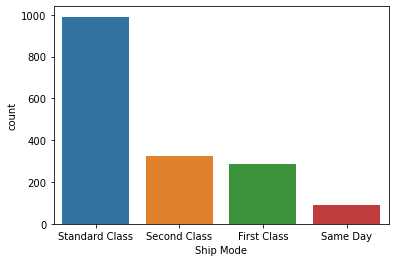

In [14]:
sns.countplot('Ship Mode', data = dfagg)

##### 2. When a customer place an order what is the probablity that he consume "First class" as SHIP MODE. Show Probablity of Each Mode in Generalized manner Of SHIP MODE.

In [69]:
rating_probs = dfagg.groupby('Ship Mode').size().div(len(dfagg))
rating_probs

Ship Mode
First Class       0.168346
Same Day          0.052756
Second Class      0.191464
Standard Class    0.587433
dtype: float64

##### 3. After Getting the Visuals of SHIP MODE, Identify the SHIP MODE consumptionby each  SEGMENT..

In [85]:
CrosstabResult=pd.crosstab(index=data['Ship Mode'],columns=data['Segment'])
print(CrosstabResult)
 

Segment      0    1    2
Ship Mode               
0          270  175  127
1           91   46   49
2          349  197  111
3          958  562  377


<AxesSubplot:xlabel='Ship Mode'>

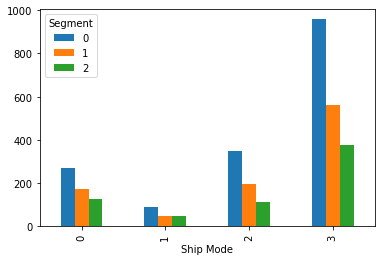

In [86]:
CrosstabResult.plot.bar()

Segment         Consumer  Corporate  Home Office
Ship Mode                                       
First Class          270        175          127
Same Day              91         46           49
Second Class         349        197          111
Standard Class       958        562          377


<AxesSubplot:xlabel='Ship Mode'>

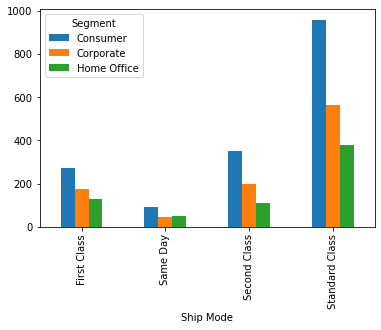

In [94]:
CrosstabResult=pd.crosstab(index=df['Ship Mode'],columns=df['Segment'])
print(CrosstabResult)
 CrosstabResult.plot.bar()

##### 4. Find corelation between segment and shipping mode. Generalize Coorelation on whole data.

In [140]:
# plt.rcParams['figure.dpi'] = 900

# fig = plt.figure(figsize=(16,10))
# sns.heatmap(data.corr(), ax=ax0,annot=True,)

cor_df = data.corr()
fig = plt.figure(figsize=(16,10))
sns.heatmap(cor_df, annot = True,
xticklabels=cor_df.columns.values,
yticklabels=cor_df.columns.values)
plt.show()


In [141]:
g_dummies_ship_mode = pd.get_dummies(df['Ship Mode'])
g_dummies_ship_mode.head()
g_dummies_segment = pd.get_dummies(df['Segment'])
# g_dummies_segment.head()
df_categories=df["Order ID"]
df_categories = pd.concat([df_categories, g_dummies_ship_mode,g_dummies_segment], axis = 1)
# df_categories.head()

<AxesSubplot:>

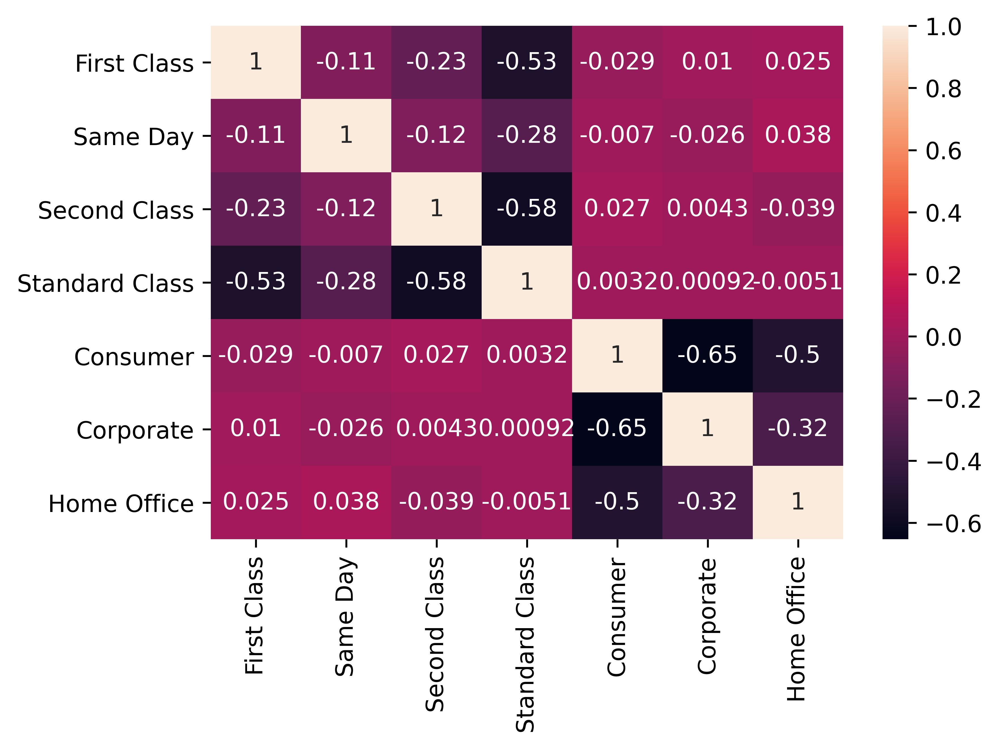

In [142]:
plt.rcParams['figure.dpi'] = 600
sns.heatmap(df_categories.corr(),annot=True,)



##### 5.What is the probablity when it is a "standard class" SHIP MODE the SEGMENT is "home office". Generalize Probablity of SEGMENT for each SHIP MODE.

In [143]:
rating_probs = dfagg.groupby('Ship Mode').size().div(len(dfagg))
rating_probs

Ship Mode
First Class       0.168346
Same Day          0.052756
Second Class      0.191464
Standard Class    0.587433
dtype: float64

In [146]:
dfagg.groupby('Ship Mode')['Segment'].value_counts()

Ship Mode       Segment    
First Class     Consumer       141
                Corporate       86
                Home Office     57
Same Day        Consumer        48
                Corporate       23
                Home Office     18
Second Class    Consumer       168
                Corporate      103
                Home Office     52
Standard Class  Consumer       519
                Corporate      281
                Home Office    191
Name: Segment, dtype: int64

In [147]:
df.groupby('Ship Mode')['Segment'].value_counts() / df.groupby('Ship Mode')['Segment'].count()


Ship Mode       Segment    
First Class     Consumer       0.472028
                Corporate      0.305944
                Home Office    0.222028
Same Day        Consumer       0.489247
                Home Office    0.263441
                Corporate      0.247312
Second Class    Consumer       0.531202
                Corporate      0.299848
                Home Office    0.168950
Standard Class  Consumer       0.505008
                Corporate      0.296257
                Home Office    0.198735
Name: Segment, dtype: float64

In [177]:
 x =np.unique( np.array(df['City']))
print(len(x))

350


In [21]:
aa=[.1 for item in range(0, 350)]
print(len(aa))
# aa

350


##### 6. Plot Discount availed by Each City


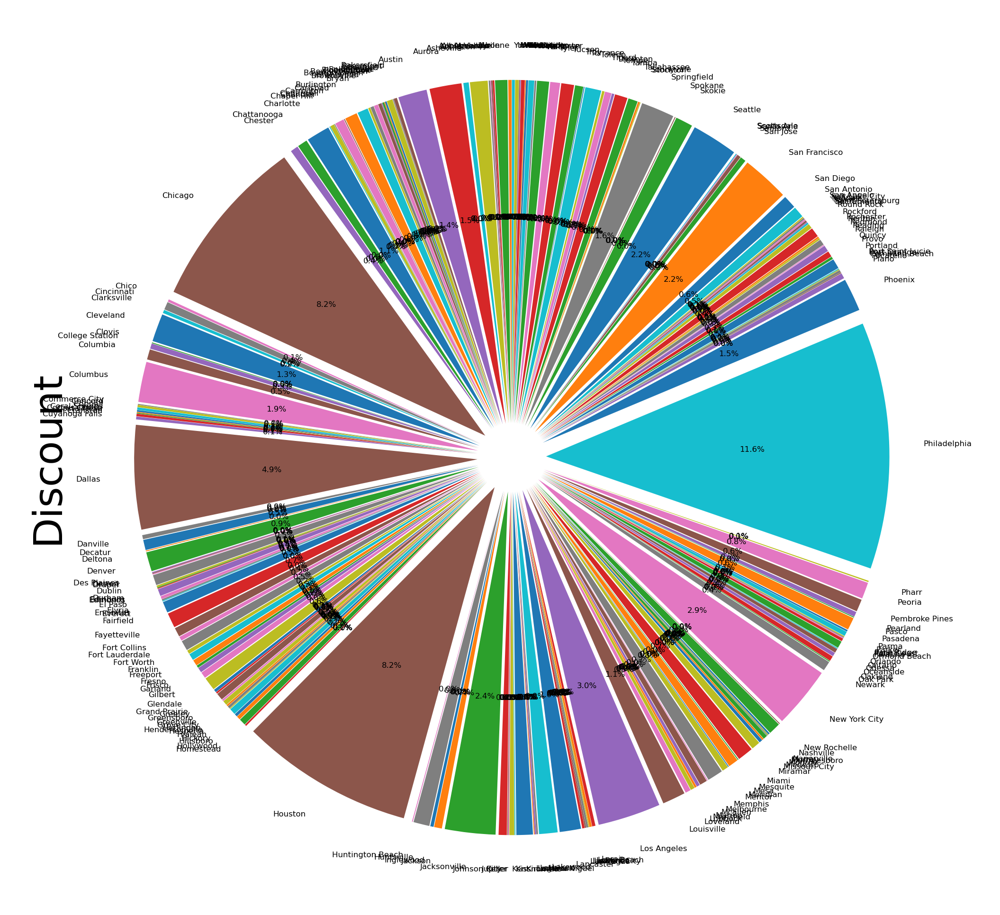

<Figure size 9600x6000 with 0 Axes>

In [27]:

pie = df.groupby('City')['Discount'].sum().plot(kind = 'pie',fontsize=2,radius=1,
    explode=aa,startangle=90,autopct='%1.1f%%',)
fig = plt.figure(figsize=(16,10))
plt.tight_layout()


##### 7. Plot Sales Performed by Each City

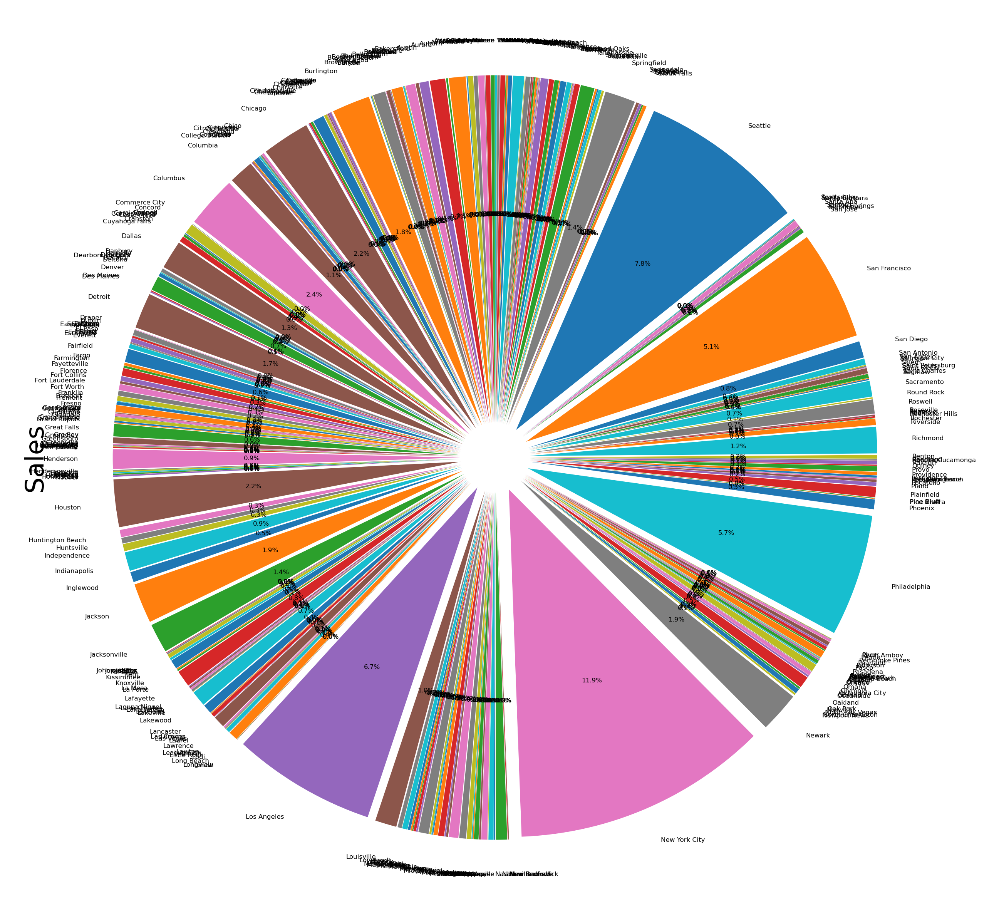

In [203]:
pie = df.groupby('City')['Sales'].sum().plot(kind = 'pie',fontsize=2,radius=1,
    explode=aa,startangle=90,autopct='%1.1f%%',)
plt.tight_layout()
ssss
# pie

##### 8. What is the probablity that City 'New York City' consumed 'standard class' SHIP MODE?  Generalized Probablity for each SHIP MODE.

In [216]:
dd=df.groupby('City')['Ship Mode'].value_counts() / df.groupby('City')['Ship Mode'].count()

In [221]:
df.query("City== 'New York City'").groupby('City')['Ship Mode'].value_counts() / df.groupby('City')['Ship Mode'].count()

City           Ship Mode     
New York City  Standard Class    0.565359
               Second Class      0.261438
               First Class       0.137255
               Same Day          0.035948
Name: Ship Mode, dtype: float64

In [219]:
dd.to_csv(r'F:\lareb\CityToShipMode.csv')

##### 9. Show CATEGORY and SUB-CATEGORY visualization based on all PRODUCT sales

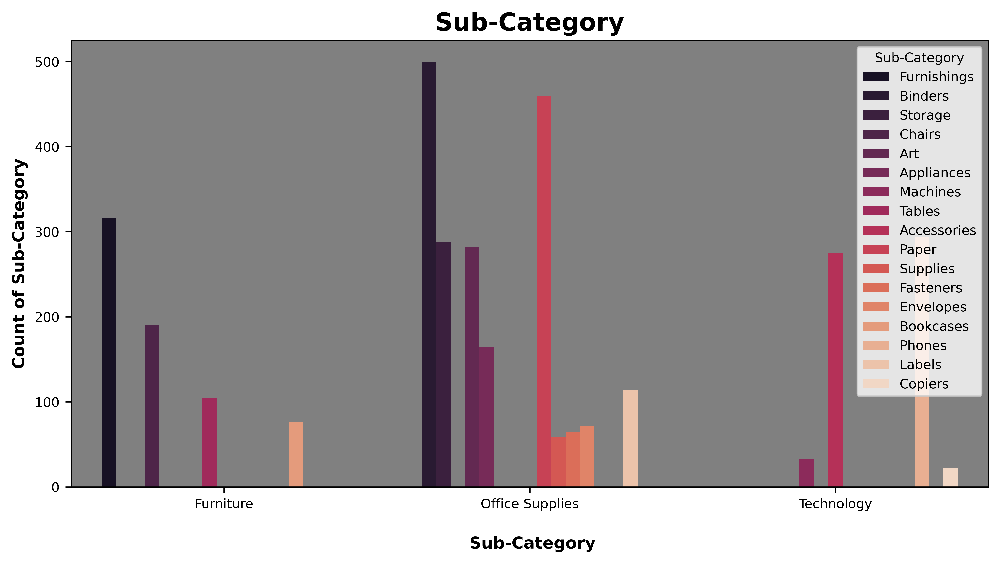

In [224]:
fig, ax = plt.subplots(figsize=(10,5))
sns.countplot(data = df, x='Category',hue='Sub-Category' ,palette='rocket')
ax.set(facecolor = 'grey')
plt.xlabel('\n Sub-Category', fontweight = 'bold', fontsize = 10)
plt.ylabel('Count of Sub-Category', fontweight = 'bold', fontsize = 10)
plt.title('Sub-Category', fontweight = 'bold', fontsize = 15)
plt.savefig("Sub-Category.png")
plt.show()

##### 10. If the CATEGORY is 'Office supply' then what will be the provbablity the SUB-CATEGORY is 'Binder'? Generalized for each  SUB-CATEGORY

In [231]:
asw=df.query("Category == 'Office Supplies'" )
asw.groupby('Category')['Sub-Category'].value_counts() / df.groupby('Category')['Sub-Category'].count()
#.groupby('City')['Ship Mode'].value_counts() / df.groupby('City')['Ship Mode'].count()

Category         Sub-Category
Office Supplies  Binders         0.249750
                 Paper           0.229271
                 Storage         0.143856
                 Art             0.140859
                 Appliances      0.082418
                 Labels          0.056943
                 Envelopes       0.035465
                 Fasteners       0.031968
                 Supplies        0.029471
Name: Sub-Category, dtype: float64

##### 11. Which CATEGORYY performs highest sales and also plot for each month

In [236]:
df_months=df_original
df_months['Month'] = df_months['Order Date'].str[3:5]
df_months['Month'] = df_months['Month'].astype('int32')
keys = [pair for pair, df in df_months.groupby(['Month'])]
fig, ax = plt.subplots(figsize=(15,15))
sns.barplot(y='Sales',x='Category',data = df_months, estimator=sum,hue = df_months['Month'], palette = 'rocket', ci = None)
ax.set(facecolor = 'grey')
plt.xlabel('Sales', fontweight = 'bold', fontsize =10)
plt.ylabel('Category', fontweight = 'bold', fontsize =10)
plt.title('Category Sales Across Months', fontweight = 'bold', fontsize =15)
plt.savefig("Category Sales Across Months.png")
plt.show()

In [282]:
asw=df.query("Month == 11")
asw

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Month
2391,01/11/2020,2567,CA-2017-123967,Second Class,SF-20200,Consumer,United States,Bellingham,Washington,98226,West,OFF-BI-10001308,Office Supplies,Binders,GBC Standard Plastic Binding Systems' Combs,25.120,5,0.2,7.8500,11
2392,01/11/2020,2568,CA-2017-123967,Second Class,SF-20200,Consumer,United States,Bellingham,Washington,98226,West,FUR-TA-10003954,Furniture,Tables,Hon 94000 Series Round Tables,2665.620,9,0.0,239.9058,11
2393,01/11/2020,8226,CA-2017-104136,Second Class,SF-20065,Consumer,United States,Everett,Massachusetts,2149,East,OFF-PA-10004243,Office Supplies,Paper,Xerox 1939,189.700,10,0.0,91.0560,11
2394,01/11/2020,8227,CA-2017-104136,Second Class,SF-20065,Consumer,United States,Everett,Massachusetts,2149,East,OFF-PA-10001033,Office Supplies,Paper,Xerox 1893,40.990,1,0.0,20.0851,11
2395,02/11/2020,2890,CA-2017-164049,Standard Class,KH-16630,Corporate,United States,Seattle,Washington,98105,West,OFF-PA-10000791,Office Supplies,Paper,"Wirebound Message Books, Four 2 3/4 x 5 Forms ...",23.850,5,0.0,10.7325,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845,30/11/2020,5586,CA-2017-105333,Standard Class,VP-21730,Home Office,United States,New York City,New York,10011,East,TEC-PH-10001468,Technology,Phones,Panasonic Business Telephones KX-T7736,546.060,3,0.0,163.8180,11
2846,30/11/2020,5587,CA-2017-105333,Standard Class,VP-21730,Home Office,United States,New York City,New York,10011,East,OFF-ST-10001809,Office Supplies,Storage,Fellowes Officeware Wire Shelving,269.490,3,0.0,5.3898,11
2847,30/11/2020,6300,CA-2017-107314,First Class,MZ-17335,Home Office,United States,San Francisco,California,94109,West,FUR-FU-10003489,Furniture,Furnishings,Contemporary Borderless Frame,25.830,3,0.0,9.5571,11
2848,30/11/2020,6936,CA-2017-137365,Second Class,BP-11095,Corporate,United States,El Paso,Texas,79907,Central,TEC-AC-10001767,Technology,Accessories,SanDisk Ultra 64 GB MicroSDHC Class 10 Memory ...,95.976,3,0.2,-10.7973,11


##### 12. On bases of best selling month plot the graph of SUB-CATEGORY  of above generated graph shows 'Technology' is most sold CATEGORY , which generate highest sales.

In [285]:
sub= asw.query("Category == 'Technology'")
sub

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Month
2406,02/11/2020,4882,CA-2017-143567,Second Class,TB-21175,Corporate,United States,Henderson,Kentucky,42420,South,TEC-AC-10004145,Technology,Accessories,Logitech diNovo Edge Keyboard,2249.910,9,0.0,517.4793,11
2411,02/11/2020,5506,CA-2017-127782,Standard Class,TH-21115,Corporate,United States,Philadelphia,Pennsylvania,19140,East,TEC-PH-10001817,Technology,Phones,Wilson Electronics DB Pro Signal Booster,859.200,4,0.4,-186.1600,11
2429,03/11/2020,5249,US-2017-110989,Second Class,EJ-14155,Consumer,United States,Seattle,Washington,98105,West,TEC-AC-10002345,Technology,Accessories,HP Standard 104 key PS/2 Keyboard,43.500,3,0.0,10.8750,11
2432,03/11/2020,6352,CA-2017-161130,Standard Class,BF-11275,Corporate,United States,Miami,Florida,33178,South,TEC-PH-10002549,Technology,Phones,Polycom SoundPoint IP 450 VoIP phone,361.376,2,0.2,27.1032,11
2433,03/11/2020,7716,US-2017-101518,Standard Class,PB-19105,Consumer,United States,Philadelphia,Pennsylvania,19140,East,TEC-AC-10001553,Technology,Accessories,Memorex 25GB 6X Branded Blu-Ray Recordable Dis...,40.776,3,0.2,0.5097,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2827,28/11/2020,2661,CA-2017-123372,Standard Class,DG-13300,Corporate,United States,New York City,New York,10035,East,TEC-PH-10002834,Technology,Phones,Google Nexus 5,1979.890,11,0.0,494.9725,11
2840,30/11/2020,3779,US-2017-148768,Second Class,PN-18775,Home Office,United States,Miami,Florida,33180,South,TEC-PH-10002564,Technology,Phones,OtterBox Defender Series Case - Samsung Galaxy S4,71.976,3,0.2,8.9970,11
2842,30/11/2020,5066,CA-2017-142090,Standard Class,SC-20380,Consumer,United States,Burlington,North Carolina,27217,South,TEC-AC-10002001,Technology,Accessories,Logitech Wireless Gaming Headset G930,383.976,3,0.2,81.5949,11
2845,30/11/2020,5586,CA-2017-105333,Standard Class,VP-21730,Home Office,United States,New York City,New York,10011,East,TEC-PH-10001468,Technology,Phones,Panasonic Business Telephones KX-T7736,546.060,3,0.0,163.8180,11


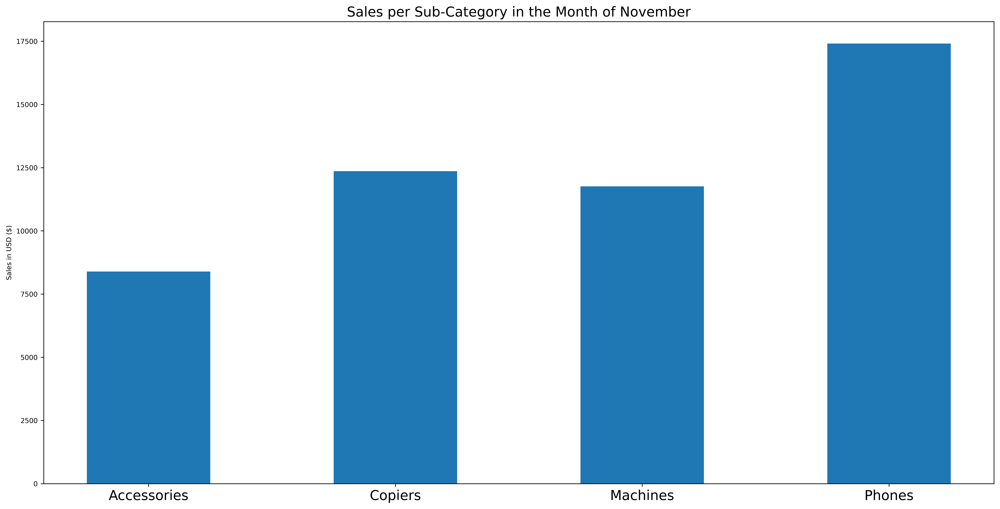

In [288]:
keys = [state for state, df in sub.groupby(['Sub-Category'])]

plt.bar(keys,sub.groupby(['Sub-Category']).sum()['Sales'],  width=.5)
# plt.rcParams["figure.figsize"] = (20, 10)
# plt.figure(figsize=(10,10),dpi= 80)
plt.ylabel('Sales in USD ($)')
plt.title("Sales per Sub-Category in the Month of November", fontsize=16)
# plt.xlabel('States')
# plt.figure(figsize = (12,6))
plt.xticks(keys,fontsize=16)
plt.show()

##### 13. On bases of best selling MONTH plot the graph of STATES which  generate highest SALES.

In [255]:
df_months['Month'] = df_months['Month'].astype('int32')
df_months.dtypes


Order Date       object
Row ID            int64
Order ID         object
Ship Mode        object
Customer ID      object
Segment          object
Country          object
City             object
State            object
Postal Code       int64
Region           object
Product ID       object
Category         object
Sub-Category     object
Product Name     object
Sales           float64
Quantity          int64
Discount        float64
Profit          float64
Month             int32
dtype: object

In [268]:

asw.groupby(['State']).sum()['Sales']

State
Alabama             239.920
Arizona            3192.462
Arkansas              4.300
California        13580.951
Colorado             88.768
Delaware          10756.850
Florida            5236.966
Georgia             360.190
Illinois           1227.371
Indiana            3980.310
Iowa                 45.920
Kansas               79.310
Kentucky           6343.470
Maryland           4676.490
Massachusetts       281.630
Michigan           1024.110
Minnesota           153.460
Mississippi         173.800
Missouri            260.000
New Jersey           46.260
New Mexico          201.360
New York          18190.242
North Carolina    13993.298
Ohio               4523.492
Oklahoma             38.160
Oregon               29.448
Pennsylvania       7158.675
South Carolina      406.940
South Dakota         25.500
Tennessee          1869.917
Texas              7968.447
Utah                 19.440
Virginia             88.620
Washington        11829.358
Wisconsin           352.390
Name: Sales, d

In [279]:

keys = [state for state, df in asw.groupby(['State'])]

plt.bar(keys,asw.groupby(['State']).sum()['Sales'],  width=.5)
# plt.rcParams["figure.figsize"] = (20, 10)
# plt.figure(figsize=(10,10),dpi= 80)
plt.ylabel('Sales in USD ($)')
plt.title("Sales per State in the Month of November", fontsize=16)
# plt.xlabel('States')
# plt.figure(figsize = (12,6))
plt.xticks(keys, rotation=60)
plt.show()

##### 14. Which CATEGORY performs highest PROFIT and also plot for each MONTH.

In [290]:
keys = [pair for pair, df in df_months.groupby(['Month'])]
fig, ax = plt.subplots(figsize=(15,15))
sns.barplot(y='Profit',x='Category',data = df_months, estimator=sum,hue = df_months['Month'], palette = 'rocket', ci = None)
ax.set(facecolor = 'grey')
plt.xlabel('Profit', fontweight = 'bold', fontsize =10)
plt.ylabel('Category', fontweight = 'bold', fontsize =10)
plt.title('Category Profit Across Months', fontweight = 'bold', fontsize =15)
plt.savefig("Category Profit Across Months.png")
plt.show()

##### 15. On bases of best PROFIT MONTH plot the graph of SUB_CATEGORY of above generated graph shows 'Technology' is most Profitable CATEGORY and shows in the MONTH of 'March', which generate highest SALES.

In [292]:
aa=df.query("Month == 3")
sub= aa.query("Category == 'Technology'")
sub

,Order Date,Row ID,Order ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Month
264,02/03/2020,2509,CA-2017-163902,Standard Class,MY-17380,Corporate,United States,Los Angeles,California,90045,West,TEC-PH-10000675,Technology,Phones,Panasonic KX TS3282B Corded phone,196.776,3,0.2,14.7582,3
265,02/03/2020,2510,CA-2017-163902,Standard Class,MY-17380,Corporate,United States,Los Angeles,California,90045,West,TEC-AC-10000580,Technology,Accessories,Logitech G13 Programmable Gameboard with LCD D...,479.940,6,0.0,52.7934,3
276,03/03/2020,3475,CA-2017-111815,Standard Class,EP-13915,Consumer,United States,Dearborn Heights,Michigan,48127,Central,TEC-AC-10002926,Technology,Accessories,Logitech Wireless Marathon Mouse M705,99.980,2,0.0,42.9914,3
277,03/03/2020,6576,CA-2017-123085,Standard Class,EJ-13720,Consumer,United States,Los Angeles,California,90008,West,TEC-AC-10000990,Technology,Accessories,Imation Bio 2GB USB Flash Drive Imation Corp,1049.440,8,0.0,440.7648,3
292,05/03/2020,5950,CA-2017-161046,Same Day,CB-12535,Corporate,United States,Southaven,Mississippi,38671,South,TEC-AC-10004571,Technology,Accessories,Logitech G700s Rechargeable Gaming Mouse,299.970,3,0.0,125.9874,3
302,06/03/2020,6515,CA-2017-167640,Standard Class,FC-14245,Home Office,United States,San Francisco,California,94109,West,TEC-PH-10001336,Technology,Phones,Digium D40 VoIP phone,206.384,2,0.2,23.2182,3
305,07/03/2020,1372,CA-2017-136672,Standard Class,MG-17890,Home Office,United States,Clinton,Maryland,20735,East,TEC-AC-10004510,Technology,Accessories,Logitech Desktop MK120 Mouse and keyboard Combo,49.080,3,0.0,4.9080,3
312,09/03/2020,1926,CA-2017-102834,Standard Class,LW-16990,Corporate,United States,San Francisco,California,94110,West,TEC-AC-10001908,Technology,Accessories,Logitech Wireless Headset h800,199.980,2,0.0,69.9930,3
313,09/03/2020,8540,CA-2017-147354,Standard Class,KB-16315,Consumer,United States,Los Angeles,California,90008,West,TEC-CO-10000971,Technology,Copiers,Hewlett Packard 310 Color Digital Copier,479.984,2,0.2,59.9980,3
316,10/03/2020,1255,CA-2017-144638,Standard Class,MH-18115,Home Office,United States,Chester,Pennsylvania,19013,East,TEC-PH-10000149,Technology,Phones,Cisco SPA525G2 IP Phone - Wireless,35.910,3,0.4,-8.3790,3


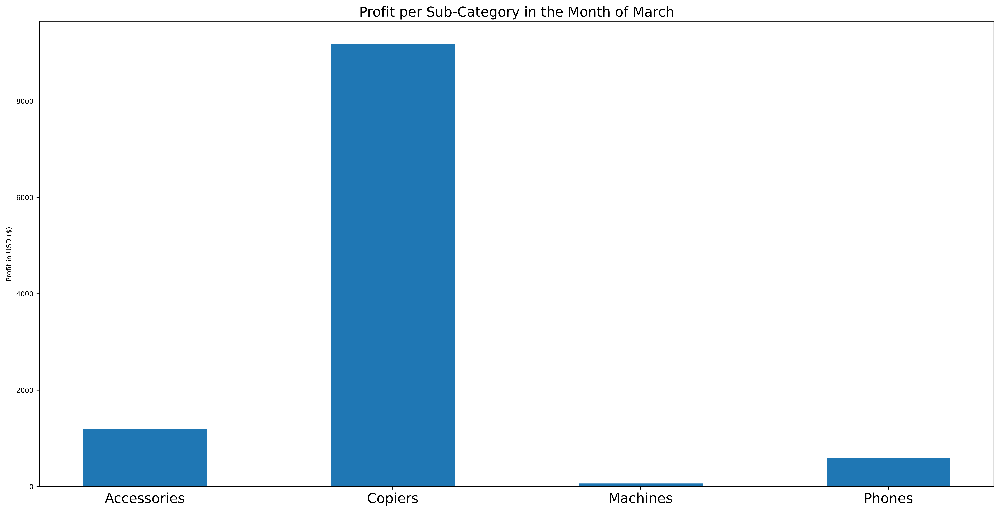

In [293]:

keys = [state for state, df in sub.groupby(['Sub-Category'])]

plt.bar(keys,sub.groupby(['Sub-Category']).sum()['Profit'],  width=.5)
# plt.rcParams["figure.figsize"] = (20, 10)
# plt.figure(figsize=(10,10),dpi= 80)
plt.ylabel('Profit in USD ($)')
plt.title("Profit per Sub-Category in the Month of March", fontsize=16)
# plt.xlabel('States')
# plt.figure(figsize = (12,6))
plt.xticks(keys,fontsize=16)
plt.show()

##### 16. Show  relation of each category with each other using graphical visualization, which interprates consumption togather.

<AxesSubplot:>

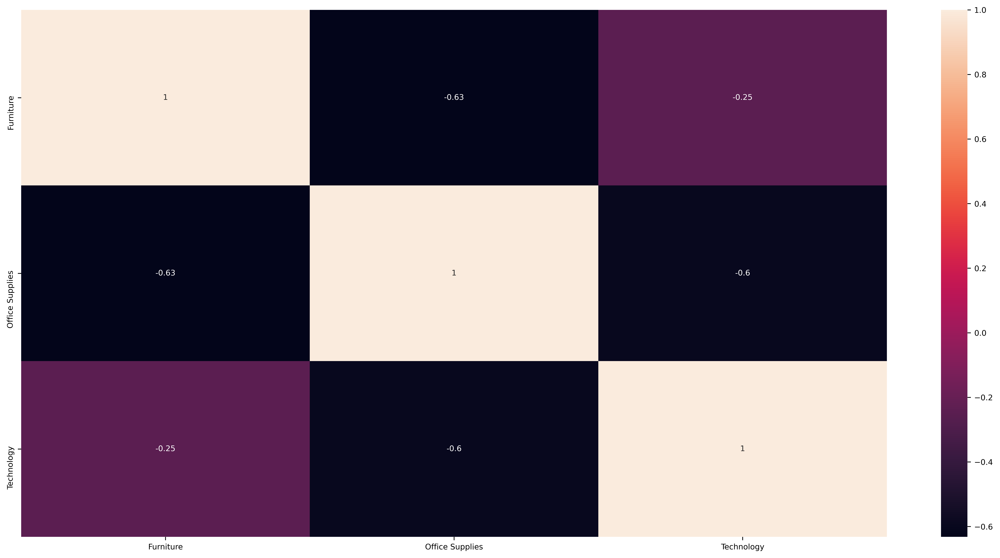

In [281]:
g_dummies_category = pd.get_dummies(df['Category'])
g_dummies_category.head()
# g_dummies_segment.head()
df_categories=df["Order ID"]
df_categories = pd.concat([df_categories, g_dummies_category], axis = 1)
#plt.rcParams['figure.dpi'] = 600
sns.heatmap(df_categories.corr(),annot=True,)


##### 17. What is the probablity that if the CATEGORY is 'furniture' the SEGMENT will be 'homeOffice'? Generalized for all SEGMENT with respect to CATEGORY.

In [294]:
df.groupby('Category')['Segment'].value_counts() / df.groupby('Category')['Segment'].count()

Category         Segment    
Furniture        Consumer       0.513120
                 Corporate      0.288630
                 Home Office    0.198251
Office Supplies  Consumer       0.509990
                 Corporate      0.295205
                 Home Office    0.194805
Technology       Consumer       0.472756
                 Corporate      0.306090
                 Home Office    0.221154
Name: Segment, dtype: float64

##### 18. What is the probablity that if the category is 'Technology' the city is 'Los Angeles'? Generalized for all  REGION with respect to CATEGORY.

In [299]:

df.groupby('Category')['Region'].value_counts() / df.groupby('Category')['Region'].count()

Category         Region 
Furniture        West       0.336735
                 East       0.287172
                 Central    0.217201
                 South      0.158892
Office Supplies  West       0.325175
                 East       0.268731
                 Central    0.250250
                 South      0.155844
Technology       West       0.341346
                 East       0.298077
                 Central    0.205128
                 South      0.155449
Name: Region, dtype: float64

##### 19. What is the probablity of each CATEGORY of all the STATES in West REGION

In [300]:
region=df.query("Region == 'West'" )

region.groupby('Category')['State'].value_counts() / region.groupby('Category')['State'].count()

Category         State     
Furniture        California    0.606061
                 Washington    0.207792
                 Colorado      0.064935
                 Arizona       0.060606
                 Oregon        0.025974
                 Idaho         0.008658
                 Nevada        0.008658
                 New Mexico    0.008658
                 Utah          0.008658
Office Supplies  California    0.619048
                 Washington    0.188940
                 Arizona       0.058372
                 Colorado      0.050691
                 Oregon        0.027650
                 New Mexico    0.021505
                 Utah          0.016897
                 Idaho         0.006144
                 Montana       0.006144
                 Nevada        0.004608
Technology       California    0.563380
                 Washington    0.206573
                 Arizona       0.084507
                 Colorado      0.061033
                 New Mexico    0.028169
            

##### 20. What is the probablity of each CATEGORY of all the CITIES  in STATE.

In [305]:
city=df.query("State == 'California'" )

city_res=city.groupby('Category')['City'].value_counts() / region.groupby('Category')['City'].count()

In [306]:
city_res.to_csv(r'F:\lareb\city.csv')


##### 21. What CATEGORY offers highest DISCOUNT, does it effect the SALES

<AxesSubplot:ylabel='Profit'>

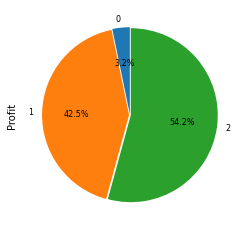

<Figure size 576x432 with 0 Axes>

In [19]:
pie = df.groupby('Category')['Profit'].sum().plot(kind= 'pie',fontsize=8,radius=1,
    explode=[0.01,0.01,0.01],startangle=90,autopct='%1.1f%%')
plt.figure(figsize = (8,6))
pie

<AxesSubplot:ylabel='Sales'>

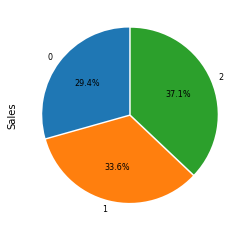

<Figure size 576x432 with 0 Axes>

In [17]:

pie = df.groupby('Category')['Sales'].sum().plot(kind= 'pie',fontsize=8,radius=1,
    explode=[0.01,0.01,0.01],startangle=90,autopct='%1.1f%%')
plt.figure(figsize = (8,6))
pie

##### 1. what are the most frequent categories combination in each 'purchase order' or 
##### what can be the possible combination in most used categories in each 'Order'?

In [47]:
df['Order Next ID'] = df['Order ID'].shift(-1)

In [46]:
# count distinct orderID where category =furniture and category =Office Supplies
# count distinct orderID where category =furniture and category =Technology
# count distinct orderID where category =Technology and category =Office Supplies
count=0
for index, row in df.iterrows():
#     if index <10:
#         print (row['Order ID'],row['Order Next ID'])
    if row['Order ID']!=row['Order Next ID']:
        count+=1
print (count)

1687


In [48]:
gk = df.groupby('Order ID')

In [50]:
gk.first()

,Order Date,Row ID,Ship Mode,Customer ID,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,Quantity,Discount,Profit,Order Next ID
Order ID,,,,,,,,,,,,,,,,,,,
CA-2017-100013,06/11/2020,1229,Standard Class,ZC-21910,Consumer,United States,Los Angeles,California,90045,West,OFF-EN-10001219,Office Supplies,Envelopes,#10- 4 1/8 inches x 9 1/2 inches Security-Tint...,15.280,2,0.0,7.4872,CA-2017-100013
CA-2017-100055,28/05/2020,9132,Standard Class,MD-17860,Corporate,United States,Laurel,Maryland,20707,East,FUR-FU-10001473,Furniture,Furnishings,DAX Wood Document Frame,27.460,2,0.0,9.8856,CA-2017-100055
CA-2017-100097,26/11/2020,7320,Second Class,MN-17935,Consumer,United States,New York City,New York,10009,East,TEC-PH-10002310,Technology,Phones,Plantronics Calisto P620-M USB Wireless Speake...,979.950,5,0.0,264.5865,CA-2017-100097
CA-2017-100111,20/09/2020,6091,Standard Class,SV-20365,Consumer,United States,New York City,New York,10035,East,FUR-CH-10003846,Furniture,Chairs,Hon Valutask Swivel Chairs,272.646,3,0.1,18.1764,CA-2017-100111
CA-2017-100160,07/09/2020,4152,Standard Class,CB-12025,Consumer,United States,Philadelphia,Pennsylvania,19134,East,OFF-LA-10002475,Office Supplies,Labels,Avery 519,29.240,5,0.2,9.8685,CA-2017-100160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
US-2017-168802,03/11/2020,8294,Standard Class,JO-15145,Corporate,United States,Seattle,Washington,98103,West,OFF-BI-10002393,Office Supplies,Binders,Binder Posts,18.368,4,0.2,5.9696,CA-2017-135419
US-2017-169320,23/07/2020,4373,Second Class,LH-16900,Consumer,United States,Elkhart,Indiana,46514,Central,OFF-AR-10003602,Office Supplies,Art,"Quartet Omega Colored Chalk, 12/Pack",11.680,2,0.0,5.4896,US-2017-169320
US-2017-169488,07/09/2020,9539,First Class,AA-10375,Consumer,United States,Providence,Rhode Island,2908,East,OFF-PA-10002659,Office Supplies,Paper,Avoid Verbal Orders Carbonless Minifold Book,16.900,5,0.0,7.7740,US-2017-169488


In [58]:
df.groupby(['Order ID','Category'])['Quantity'].sum()

Order ID        Category       
CA-2017-100013  Furniture          1
                Office Supplies    4
CA-2017-100055  Furniture          2
                Office Supplies    3
CA-2017-100097  Furniture          5
                                  ..
US-2017-169488  Office Supplies    7
US-2017-169502  Office Supplies    8
US-2017-169551  Furniture          3
                Office Supplies    6
                Technology         7
Name: Quantity, Length: 2362, dtype: int64

In [63]:
grouped =df.groupby(['Order ID','Category'])
for name, group in grouped:
    print(name)
    print(group)

('CA-2017-100013', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2482  06/11/2020    1230  CA-2017-100013  Standard Class    ZC-21910   

       Segment        Country         City       State  Postal Code Region  \
2482  Consumer  United States  Los Angeles  California        90045   West   

           Product ID   Category Sub-Category         Product Name  Sales  \
2482  FUR-FU-10001424  Furniture  Furnishings  Dax Clear Box Frame   8.73   

      Quantity  Discount  Profit   Order Next ID  
2482         1       0.0  2.9682  CA-2017-100013  
('CA-2017-100013', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2481  06/11/2020    1229  CA-2017-100013  Standard Class    ZC-21910   
2483  06/11/2020    1231  CA-2017-100013  Standard Class    ZC-21910   

       Segment        Country         City       State  Postal Code Region  \
2481  Consumer  United States  Los Angeles  California        90045   West  

793       0.0  27.4856  CA-2017-149048  
('CA-2017-100783', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID  \
1715  04/09/2020    7918  CA-2017-100783  Second Class    JK-16120   

          Segment        Country     City  State  Postal Code   Region  \
1715  Home Office  United States  Garland  Texas        75043  Central   

           Product ID         Category Sub-Category  \
1715  OFF-AR-10000380  Office Supplies          Art   

                                         Product Name   Sales  Quantity  \
1715  Hunt PowerHouse Electric Pencil Sharpener, Blue  30.384         1   

      Discount  Profit   Order Next ID  
1715       0.2   3.798  CA-2017-137582  
('CA-2017-100811', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
2728  21/11/2020    4011  CA-2017-100811  First Class    CC-12475  Consumer   
2729  21/11/2020    4012  CA-2017-100811  First Class    CC-12475  Consumer   

           

651       0.2   7.008  CA-2017-101700  
('CA-2017-101728', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1539  19/08/2020    4921  CA-2017-101728  Standard Class    SC-20575   

       Segment        Country     City     State  Postal Code   Region  \
1539  Consumer  United States  Chicago  Illinois        60653  Central   

           Product ID         Category Sub-Category  Product Name  Sales  \
1539  OFF-BI-10002393  Office Supplies      Binders  Binder Posts  2.296   

      Quantity  Discount  Profit   Order Next ID  
1539         2       0.8 -3.9032  CA-2017-115777  
('CA-2017-101749', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2133  03/10/2020    3040  CA-2017-101749  Standard Class    AS-10045   

        Segment        Country      City       State  Postal Code Region  \
2133  Corporate  United States  Pasadena  California        91104   West   

           Product ID   Category Sub-Catego

825       0.2  5.6376  US-2017-110604  
('CA-2017-102414', 'Technology')
     Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
823  15/05/2020     957  CA-2017-102414  Second Class    JA-15970  Consumer   

           Country     City    State  Postal Code Region       Product ID  \
823  United States  Phoenix  Arizona        85023   West  TEC-PH-10002923   

       Category Sub-Category  \
823  Technology       Phones   

                                          Product Name   Sales  Quantity  \
823  Logitech B530 USB Headset - headset - Full siz...  29.592         1   

     Discount  Profit   Order Next ID  
823       0.2  2.5893  CA-2017-102414  
('CA-2017-102519', 'Furniture')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2808  27/11/2020     914  CA-2017-102519  First Class    BM-11650  Corporate   

            Country       City      State  Postal Code   Region  \
2808  United States  Milwaukee  Wisconsin        53209 

2228  346.0396  CA-2017-103212  
('CA-2017-103212', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
2227  13/10/2020    9221  CA-2017-103212  First Class    MH-18025  Consumer   
2229  13/10/2020    9223  CA-2017-103212  First Class    MH-18025  Consumer   

            Country       City      State  Postal Code Region  \
2227  United States  Lafayette  Louisiana        70506  South   
2229  United States  Lafayette  Louisiana        70506  South   

           Product ID         Category Sub-Category Product Name  Sales  \
2227  OFF-LA-10000248  Office Supplies       Labels     Avery 52  11.07   
2229  OFF-PA-10004355  Office Supplies        Paper    Xerox 231  25.92   

      Quantity  Discount   Profit   Order Next ID  
2227         3       0.0   5.2029  CA-2017-103212  
2229         4       0.0  12.4416  CA-2017-150707  
('CA-2017-103352', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segmen

3125       0.2   10.43  CA-2017-161578  
('CA-2017-104388', 'Technology')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
1220  05/07/2020    9569  CA-2017-104388  First Class    DK-12835  Corporate   

            Country     City     State  Postal Code   Region       Product ID  \
1220  United States  Fremont  Nebraska        68025  Central  TEC-PH-10002293   

        Category Sub-Category  \
1220  Technology       Phones   

                                           Product Name  Sales  Quantity  \
1220  Anker 36W 4-Port USB Wall Charger Travel Power...  79.96         4   

      Discount   Profit   Order Next ID  
1220       0.0  22.3888  US-2017-124303  
('CA-2017-104577', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID   Segment  \
782  12/05/2020    3762  CA-2017-104577  Standard Class    CK-12205  Consumer   

           Country     City          State  Postal Code Region  \
782  United States  Everett  Ma

2731  CA-2017-110443  
('CA-2017-105144', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2446  04/11/2020    1411  CA-2017-105144  Standard Class    SZ-20035   

          Segment        Country           City  State  Postal Code   Region  \
2446  Home Office  United States  Grand Prairie  Texas        75051  Central   

           Product ID         Category Sub-Category  \
2446  OFF-LA-10003923  Office Supplies       Labels   

                                Product Name  Sales  Quantity  Discount  \
2446  Alphabetical Labels for Top Tab Filing  23.68         2       0.2   

      Profit   Order Next ID  
2446    8.88  CA-2017-147760  
('CA-2017-105193', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID   Segment  \
446  25/03/2020    5608  CA-2017-105193  Standard Class    JL-15835  Consumer   

           Country           City     State  Postal Code Region  \
446  United States  New York City  New Yo

1907  88.485  CA-2017-126928  
('CA-2017-105809', 'Furniture')
     Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
230  20/02/2020     801  CA-2017-105809  First Class    HW-14935  Corporate   

           Country       City       State  Postal Code Region  \
230  United States  San Diego  California        92105   West   

          Product ID   Category Sub-Category  \
230  FUR-FU-10004090  Furniture  Furnishings   

                                          Product Name  Sales  Quantity  \
230  Executive Impressions 14 inches Contract Wall ...  22.23         1   

     Discount  Profit   Order Next ID  
230       0.0  7.3359  CA-2017-105809  
('CA-2017-105809', 'Technology')
     Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
231  20/02/2020     802  CA-2017-105809  First Class    HW-14935  Corporate   

           Country       City       State  Postal Code Region  \
231  United States  San Diego  California        92105   West 

947       0.2  10.0572  CA-2017-106831  
('CA-2017-106831', 'Technology')
     Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
948  01/06/2020    4840  CA-2017-106831  First Class    FH-14350  Consumer   

           Country    City State  Postal Code Region       Product ID  \
948  United States  Dublin  Ohio        43017   East  TEC-PH-10001700   

       Category Sub-Category  \
948  Technology       Phones   

                                          Product Name    Sales  Quantity  \
948  Panasonic KX-TG6844B Expandable Digital Cordle...  158.376         4   

     Discount   Profit   Order Next ID  
948       0.4 -34.3148  CA-2017-146493  
('CA-2017-106852', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1111  20/06/2020    1436  CA-2017-106852  Standard Class    ST-20530   
1112  20/06/2020    1437  CA-2017-106852  Standard Class    ST-20530   

       Segment        Country   City State  Postal Code Region  \

1628  77.5584  CA-2017-117198  
('CA-2017-107342', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3137  17/12/2020    2852  CA-2017-107342  Standard Class    VF-21715   

          Segment        Country      City    State  Postal Code   Region  \
3137  Home Office  United States  Columbus  Indiana        47201  Central   

           Product ID         Category Sub-Category  \
3137  OFF-PA-10001745  Office Supplies        Paper   

                                           Product Name  Sales  Quantity  \
3137  Wirebound Message Books, 2 7/8 inches x 5 inch...  28.16         4   

      Discount   Profit   Order Next ID  
3137       0.0  13.2352  CA-2017-116855  
('CA-2017-107461', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
3184  21/12/2020    3171  CA-2017-107461  Second Class    PK-19075  Consumer   

            Country      City           State  Postal Code Region  \
3184  United S

1636  US-2017-135230  
('CA-2017-107909', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1635  01/09/2020    4332  CA-2017-107909  Standard Class    SS-20875   

       Segment        Country     City       State  Postal Code Region  \
1635  Consumer  United States  Redmond  Washington        98052   West   

           Product ID    Category Sub-Category  \
1635  TEC-AC-10001998  Technology  Accessories   

                                           Product Name  Sales  Quantity  \
1635  Logitech LS21 Speaker System - PC Multimedia -...  19.99         1   

      Discount  Profit   Order Next ID  
1635       0.0  6.7966  CA-2017-107909  
('CA-2017-107958', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID  \
1193  02/07/2020    7696  CA-2017-107958  First Class    AH-10120   
1194  02/07/2020    7697  CA-2017-107958  First Class    AH-10120   

          Segment        Country     City  State  Postal Code   Regi

3267  US-2017-106705  
('CA-2017-108791', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1379  27/07/2020    5297  CA-2017-108791  Standard Class    TM-21490   

       Segment        Country     City     State  Postal Code Region  \
1379  Consumer  United States  Yonkers  New York        10701   East   

           Product ID   Category Sub-Category                  Product Name  \
1379  FUR-FU-10004018  Furniture  Furnishings  Tensor Computer Mounted Lamp   

      Sales  Quantity  Discount  Profit   Order Next ID  
1379  14.89         1       0.0  4.0203  CA-2017-108791  
('CA-2017-108791', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1380  27/07/2020    5298  CA-2017-108791  Standard Class    TM-21490   

       Segment        Country     City     State  Postal Code Region  \
1380  Consumer  United States  Yonkers  New York        10701   East   

           Product ID    Category Sub-Category  \
1380  T

1667       0.2 -44.2350  CA-2017-113075  
('CA-2017-111262', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2358  28/10/2020    6496  CA-2017-111262  Second Class    KH-16510  Consumer   

            Country     City  State  Postal Code   Region       Product ID  \
2358  United States  Houston  Texas        77095  Central  OFF-PA-10001937   

             Category Sub-Category Product Name   Sales  Quantity  Discount  \
2358  Office Supplies        Paper     Xerox 21  15.552         3       0.2   

      Profit   Order Next ID  
2358  5.4432  CA-2017-111262  
('CA-2017-111262', 'Technology')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2357  28/10/2020    6495  CA-2017-111262  Second Class    KH-16510  Consumer   
2359  28/10/2020    6497  CA-2017-111262  Second Class    KH-16510  Consumer   

            Country     City  State  Postal Code   Region       Product ID  \
2357  United States  Houston 

1088      0.15  75.5937  CA-2017-112753  
('CA-2017-112753', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1089  18/06/2020    4497  CA-2017-112753  Standard Class    CC-12670   

       Segment        Country         City       State  Postal Code Region  \
1089  Consumer  United States  Los Angeles  California        90032   West   

           Product ID         Category Sub-Category Product Name  Sales  \
1089  OFF-PA-10002036  Office Supplies        Paper   Xerox 1930  38.88   

      Quantity  Discount   Profit   Order Next ID  
1089         6       0.0  19.0512  CA-2017-162712  
('CA-2017-112774', 'Furniture')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
1807  11/09/2020     553  CA-2017-112774  First Class    RC-19960  Consumer   

            Country          City    State  Postal Code Region  \
1807  United States  Jacksonville  Florida        32216  South   

           Product ID   Category Sub-Ca

2237         5       0.0  100.4255  CA-2017-164819  
('CA-2017-113705', 'Furniture')
     Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
465  27/03/2020    9757  CA-2017-113705  Second Class    LC-16870  Consumer   

           Country      City     State  Postal Code Region       Product ID  \
465  United States  Richmond  Virginia        23223  South  FUR-TA-10002533   

      Category Sub-Category           Product Name  Sales  Quantity  Discount  \
465  Furniture       Tables  BPI Conference Tables  292.1         2       0.0   

     Profit   Order Next ID  
465   58.42  CA-2017-113705  
('CA-2017-113705', 'Office Supplies')
     Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
462  27/03/2020    9754  CA-2017-113705  Second Class    LC-16870  Consumer   
463  27/03/2020    9755  CA-2017-113705  Second Class    LC-16870  Consumer   
464  27/03/2020    9756  CA-2017-113705  Second Class    LC-16870  Consumer   
467  27/03/2020    9

1143  CA-2017-133256  
('CA-2017-115427', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3309  30/12/2020    1297  CA-2017-115427  Standard Class    EB-13975   
3310  30/12/2020    1298  CA-2017-115427  Standard Class    EB-13975   

        Segment        Country       City       State  Postal Code Region  \
3309  Corporate  United States  Fairfield  California        94533   West   
3310  Corporate  United States  Fairfield  California        94533   West   

           Product ID         Category Sub-Category  \
3309  OFF-BI-10002103  Office Supplies      Binders   
3310  OFF-BI-10004632  Office Supplies      Binders   

                                         Product Name   Sales  Quantity  \
3309  Cardinal Slant-D Ring Binder, Heavy Gauge Vinyl  13.904         2   
3310                               GBC Binding covers  20.720         2   

      Discount  Profit   Order Next ID  
3309       0.2  4.5188  CA-2017-115427  
3310       0.2  

3169  CA-2017-116946  
('CA-2017-116953', 'Technology')
     Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
658  24/04/2020    5978  CA-2017-116953  First Class    SV-20935  Consumer   

           Country  City    State  Postal Code Region       Product ID  \
658  United States  Mesa  Arizona        85204   West  TEC-PH-10004614   

       Category Sub-Category       Product Name  Sales  Quantity  Discount  \
658  Technology       Phones  AT&T 841000 Phone  552.0        10       0.2   

     Profit   Order Next ID  
658    34.5  US-2017-128832  
('CA-2017-116988', 'Furniture')
      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
1162  27/06/2020    8734  CA-2017-116988  Second Class    PW-19030  Corporate   

            Country     City       State  Postal Code Region       Product ID  \
1162  United States  Seattle  Washington        98105   West  FUR-FU-10001290   

       Category Sub-Category                                 Pr

1994       0.0  102.186  CA-2017-138422  
('CA-2017-117513', 'Furniture')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
279  03/03/2020    8619  CA-2017-117513  Standard Class    BT-11395   

       Segment        Country         City       State  Postal Code Region  \
279  Corporate  United States  Los Angeles  California        90004   West   

          Product ID   Category Sub-Category  \
279  FUR-TA-10001520  Furniture       Tables   

                                          Product Name    Sales  Quantity  \
279  Lesro Sheffield Collection Coffee Table, End T...  399.672         7   

     Discount   Profit   Order Next ID  
279       0.2 -14.9877  CA-2017-110478  
('CA-2017-117632', 'Furniture')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
786  12/05/2020    5823  CA-2017-117632  Standard Class    CS-12175   

       Segment        Country           City       State  Postal Code Region  \
786  Corporate  United States  San Fr

769       0.0   2.6784  CA-2017-118199  
('CA-2017-118199', 'Technology')
     Order Date  Row ID        Order ID    Ship Mode Customer ID      Segment  \
770  09/05/2020    8421  CA-2017-118199  First Class    LB-16795  Home Office   

           Country     City       State  Postal Code Region       Product ID  \
770  United States  Seattle  Washington        98105   West  TEC-AC-10004171   

       Category Sub-Category  \
770  Technology  Accessories   

                                          Product Name   Sales  Quantity  \
770  Razer Kraken 7.1 Surround Sound Over Ear USB G...  199.98         2   

     Discount   Profit   Order Next ID  
770       0.0  87.9912  CA-2017-133823  
('CA-2017-118213', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID  \
2475  05/11/2020    9498  CA-2017-118213  First Class    AB-10060   
2476  05/11/2020    9499  CA-2017-118213  First Class    AB-10060   
2477  05/11/2020    9500  CA-2017-118213  First Class    

3197       0.7 -1.3128  CA-2017-119193  
('CA-2017-119193', 'Technology')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
3198  22/12/2020    2729  CA-2017-119193  First Class    SK-19990  Consumer   

            Country    City State  Postal Code Region       Product ID  \
3198  United States  Toledo  Ohio        43615   East  TEC-PH-10003072   

        Category Sub-Category  \
3198  Technology       Phones   

                                           Product Name    Sales  Quantity  \
3198  Panasonic KX-TG9541B DECT 6.0 Digital 2-Line E...  629.958         7   

      Discount   Profit   Order Next ID  
3198       0.4  94.4937  CA-2017-119578  
('CA-2017-119284', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1058  15/06/2020    8698  CA-2017-119284  Standard Class    TS-21205   
1059  15/06/2020    8699  CA-2017-119284  Standard Class    TS-21205   

        Segment        Country       City      State  Postal 

3191         1       0.0  30.5964  CA-2017-120376  
('CA-2017-120404', 'Furniture')
      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
2720  20/11/2020    7929  CA-2017-120404  Second Class    KH-16330  Corporate   

            Country           City     State  Postal Code Region  \
2720  United States  New York City  New York        10035   East   

           Product ID   Category Sub-Category  \
2720  FUR-FU-10000820  Furniture  Furnishings   

                                   Product Name  Sales  Quantity  Discount  \
2720  Tensor Brushed Steel Torchiere Floor Lamp  50.97         3       0.0   

      Profit   Order Next ID  
2720  9.1746  CA-2017-142888  
('CA-2017-120404', 'Technology')
      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
2718  20/11/2020    7927  CA-2017-120404  Second Class    KH-16330  Corporate   
2719  20/11/2020    7928  CA-2017-120404  Second Class    KH-16330  Corporate   

            Country  

      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3257  25/12/2020    6075  CA-2017-121398  Standard Class    FH-14365   
3258  25/12/2020    6076  CA-2017-121398  Standard Class    FH-14365   

        Segment        Country         City       State  Postal Code Region  \
3257  Corporate  United States  Los Angeles  California        90008   West   
3258  Corporate  United States  Los Angeles  California        90008   West   

           Product ID         Category Sub-Category  \
3257  OFF-BI-10001718  Office Supplies      Binders   
3258  OFF-ST-10002756  Office Supplies      Storage   

                                           Product Name    Sales  Quantity  \
3257          GBC DocuBind P50 Personal Binding Machine  153.552         3   
3258  Tennsco Stur-D-Stor Boltless Shelving, 5 Shelv...  270.620         2   

      Discount   Profit   Order Next ID  
3257       0.2  51.8238  CA-2017-121398  
3258       0.0   2.7062  CA-2017-162880  
('CA-2017-121412',

1536  CA-2017-162936  
('CA-2017-122035', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1325  20/07/2020    2317  CA-2017-122035  Standard Class    EM-13825   

        Segment        Country         City         State  Postal Code  \
1325  Corporate  United States  Sioux Falls  South Dakota        57103   

       Region       Product ID   Category Sub-Category  \
1325  Central  FUR-CH-10003833  Furniture       Chairs   

                   Product Name   Sales  Quantity  Discount  Profit  \
1325  Novimex Fabric Task Chair  182.94         3       0.0  27.441   

       Order Next ID  
1325  CA-2017-122035  
('CA-2017-122035', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1322  20/07/2020    2314  CA-2017-122035  Standard Class    EM-13825   
1323  20/07/2020    2315  CA-2017-122035  Standard Class    EM-13825   
1324  20/07/2020    2316  CA-2017-122035  Standard Class    EM-13825   
1326  20/07/2020   

2090       0.0  47.994  US-2017-120908  
('CA-2017-123036', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1805  10/09/2020    6886  CA-2017-123036  Standard Class    HA-14905   
1806  10/09/2020    6887  CA-2017-123036  Standard Class    HA-14905   

       Segment        Country         City State  Postal Code Region  \
1805  Consumer  United States  Springfield  Ohio        45503   East   
1806  Consumer  United States  Springfield  Ohio        45503   East   

           Product ID    Category Sub-Category  \
1805  TEC-AC-10003499  Technology  Accessories   
1806  TEC-PH-10003580  Technology       Phones   

                                           Product Name    Sales  Quantity  \
1805  Memorex Mini Travel Drive 8 GB USB 2.0 Flash D...   37.056         4   
1806                 Cisco IP Phone 7961G-GE VoIP phone  259.896         2   

      Discount   Profit   Order Next ID  
1805       0.2   8.8008  CA-2017-123036  
1806       0.4 -56.310

2620         8       0.0  9.9296  CA-2017-108112  
('CA-2017-124296', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3236  24/12/2020    4031  CA-2017-124296  Standard Class    CS-12355   

       Segment        Country       City      State  Postal Code Region  \
3236  Consumer  United States  Lafayette  Louisiana        70506  South   

           Product ID   Category Sub-Category  \
3236  FUR-CH-10002439  Furniture       Chairs   

                                       Product Name   Sales  Quantity  \
3236  Iceberg Nesting Folding Chair, 19w x 6d x 43h  232.88         4   

      Discount   Profit   Order Next ID  
3236       0.0  60.5488  CA-2017-145219  
('CA-2017-124296', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3235  24/12/2020    4030  CA-2017-124296  Standard Class    CS-12355   

       Segment        Country       City      State  Postal Code Region  \
3235  Consumer  United States  Lafayet

1186       0.2   5.368  CA-2017-109393  
('CA-2017-125752', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1406  31/07/2020    3785  CA-2017-125752  Standard Class    EH-14125   

          Segment        Country             City    State  Postal Code  \
1406  Home Office  United States  Fort Lauderdale  Florida        33311   

     Region       Product ID    Category Sub-Category  \
1406  South  TEC-AC-10003590  Technology  Accessories   

                                           Product Name   Sales  Quantity  \
1406  TRENDnet 56K USB 2.0 Phone, Internet and Fax M...  41.424         2   

      Discount  Profit   Order Next ID  
1406       0.2  8.2848  CA-2017-115805  
('CA-2017-125878', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID   Segment  \
248  25/02/2020    3765  CA-2017-125878  Standard Class    MH-18025  Consumer   

           Country     City     State  Postal Code   Region       Product ID 

1909       0.0   9.534  CA-2017-142293  
('CA-2017-126928', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1908  17/09/2020    8878  CA-2017-126928  Standard Class    GZ-14470   

       Segment        Country        City       State  Postal Code Region  \
1908  Consumer  United States  Morristown  New Jersey         7960   East   

           Product ID    Category Sub-Category  \
1908  TEC-MA-10004626  Technology     Machines   

                                           Product Name  Sales  Quantity  \
1908  Lexmark 20R1285 X6650 Wireless All-in-One Printer  480.0         4   

      Discount  Profit   Order Next ID  
1908       0.0   225.6  CA-2017-126928  
('CA-2017-126956', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1550  21/08/2020     827  CA-2017-126956  Standard Class    GT-14710   
1551  21/08/2020     828  CA-2017-126956  Standard Class    GT-14710   
1552  21/08/2020     829  CA-2017-12

1632  CA-2017-132619  
('CA-2017-127726', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
1827  11/09/2020    9333  CA-2017-127726  Second Class    SS-20410  Consumer   
1828  11/09/2020    9334  CA-2017-127726  Second Class    SS-20410  Consumer   

            Country        City     State  Postal Code Region  \
1827  United States  Georgetown  Kentucky        40324  South   
1828  United States  Georgetown  Kentucky        40324  South   

           Product ID         Category Sub-Category  \
1827  OFF-AP-10002578  Office Supplies   Appliances   
1828  OFF-FA-10000992  Office Supplies    Fasteners   

                                           Product Name   Sales  Quantity  \
1827  Fellowes Premier Superior Surge Suppressor, 10...  195.68         4   
1828  Acco Clips to Go Binder Clips, 24 Clips in Two...   14.20         4   

      Discount   Profit   Order Next ID  
1827       0.0  50.8768  CA-2017-127726  
1828       0.0   6.6

1262         3       0.0  7.9128  CA-2017-127460  
('CA-2017-128699', 'Technology')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2923  03/12/2020    3465  CA-2017-128699  Second Class    ND-18370  Consumer   

            Country          City    State  Postal Code Region  \
2923  United States  Jacksonville  Florida        32216  South   

           Product ID    Category Sub-Category  \
2923  TEC-AC-10001990  Technology  Accessories   

                                           Product Name   Sales  Quantity  \
2923  Kensington Orbit Wireless Mobile Trackball for...  47.992         1   

      Discount  Profit   Order Next ID  
2923       0.2  7.1988  US-2017-149510  
('CA-2017-128734', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3239  24/12/2020    5148  CA-2017-128734  Standard Class    JL-15175   
3240  24/12/2020    5149  CA-2017-128734  Standard Class    JL-15175   

          Segment        Country   

3075  CA-2017-149706  
('CA-2017-129707', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID   Segment  \
665  25/04/2020    5434  CA-2017-129707  Standard Class    LH-16750  Consumer   

           Country      City    State  Postal Code Region       Product ID  \
665  United States  Chandler  Arizona        85224   West  OFF-AR-10000246   

            Category Sub-Category Product Name  Sales  Quantity  Discount  \
665  Office Supplies          Art   Newell 318  8.896         4       0.2   

     Profit   Order Next ID  
665  0.6672  CA-2017-120222  
('CA-2017-129805', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3281  28/12/2020    2432  CA-2017-129805  Standard Class    HM-14860   

        Segment        Country     City       State  Postal Code Region  \
3281  Corporate  United States  Seattle  Washington        98103   West   

           Product ID   Category Sub-Category  \
3281  FUR-FU-10001935  Furn

1394         1       0.2  15.599  CA-2017-146031  
('CA-2017-130834', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2436  03/11/2020    8048  CA-2017-130834  Second Class    JM-16195  Consumer   

            Country        City           State  Postal Code Region  \
2436  United States  Wilmington  North Carolina        28403  South   

           Product ID         Category Sub-Category  \
2436  OFF-PA-10003673  Office Supplies        Paper   

                      Product Name   Sales  Quantity  Discount  Profit  \
2436  Strathmore Photo Mount Cards  16.272         3       0.2  5.2884   

       Order Next ID  
2436  US-2017-168802  
('CA-2017-130841', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1386  28/07/2020    2219  CA-2017-130841  Standard Class    MH-17620   
1387  28/07/2020    2220  CA-2017-130841  Standard Class    MH-17620   

        Segment        Country           City 

1256       0.2  14.3075  CA-2017-145128  
('CA-2017-132178', 'Office Supplies')
     Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
714  03/05/2020    3632  CA-2017-132178  Second Class    DB-12970  Corporate   
715  03/05/2020    3633  CA-2017-132178  Second Class    DB-12970  Corporate   

           Country         City       State  Postal Code Region  \
714  United States  Los Angeles  California        90004   West   
715  United States  Los Angeles  California        90004   West   

          Product ID         Category Sub-Category  \
714  OFF-ST-10000464  Office Supplies      Storage   
715  OFF-ST-10000025  Office Supplies      Storage   

                                          Product Name   Sales  Quantity  \
714  Multi-Use Personal File Cart and Caster Set, T...   69.52         2   
715    Fellowes Stor/Drawer Steel Plus Storage Drawers  763.44         8   

     Discount   Profit   Order Next ID  
714       0.0  19.4656  CA-2017-132178  
715

      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1508  17/08/2020    7185  CA-2017-133102  Standard Class    ED-13885   
1509  17/08/2020    7186  CA-2017-133102  Standard Class    ED-13885   
1512  17/08/2020    7189  CA-2017-133102  Standard Class    ED-13885   

          Segment        Country     City  State  Postal Code   Region  \
1508  Home Office  United States  Houston  Texas        77095  Central   
1509  Home Office  United States  Houston  Texas        77095  Central   
1512  Home Office  United States  Houston  Texas        77095  Central   

           Product ID         Category Sub-Category  \
1508  OFF-SU-10000432  Office Supplies     Supplies   
1509  OFF-AR-10003183  Office Supplies          Art   
1512  OFF-AP-10001563  Office Supplies   Appliances   

                                           Product Name   Sales  Quantity  \
1508       Acco Side-Punched Conventional Columnar Pads   5.552         2   
1509       Avery Fluorescent Highlighte

605   7.2576  CA-2017-119389  
('CA-2017-134845', 'Technology')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
602  17/04/2020    3012  CA-2017-134845  Standard Class    SR-20425   

         Segment        Country        City     State  Postal Code Region  \
602  Home Office  United States  Louisville  Colorado        80027   West   

          Product ID    Category Sub-Category  \
602  TEC-MA-10000822  Technology     Machines   

                                  Product Name     Sales  Quantity  Discount  \
602  Lexmark MX611dhe Monochrome Laser Printer  2549.985         5       0.7   

      Profit   Order Next ID  
602 -3399.98  CA-2017-134845  
('CA-2017-134880', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2352  27/10/2020    8477  CA-2017-134880  Standard Class    TW-21025   

          Segment        Country  City    State  Postal Code Region  \
2352  Home Office  United States  Mesa  Arizona        85204  

2625  1919.976         3       0.2  215.9973  CA-2017-100601  
('CA-2017-136350', 'Furniture')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
1131  24/06/2020    4050  CA-2017-136350  Second Class    GA-14515  Consumer   
1132  24/06/2020    4051  CA-2017-136350  Second Class    GA-14515  Consumer   

            Country           City     State  Postal Code Region  \
1131  United States  New York City  New York        10011   East   
1132  United States  New York City  New York        10011   East   

           Product ID   Category Sub-Category  \
1131  FUR-FU-10003601  Furniture  Furnishings   
1132  FUR-CH-10001891  Furniture       Chairs   

                                           Product Name    Sales  Quantity  \
1131  Deflect-o RollaMat Studded, Beveled Mat for Me...  276.690         3   
1132                 Global Deluxe Office Fabric Chairs  172.764         2   

      Discount   Profit   Order Next ID  
1131       0.0  49.8042  CA-2017-1

2127         2       0.0  5.9364  CA-2017-137414  
('CA-2017-137414', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2128  02/10/2020    7207  CA-2017-137414  Standard Class    CM-12115   

       Segment        Country           City       State  Postal Code Region  \
2128  Consumer  United States  San Francisco  California        94109   West   

           Product ID    Category Sub-Category  \
2128  TEC-MA-10002930  Technology     Machines   

                                           Product Name   Sales  Quantity  \
2128  Ricoh - Ink Collector Unit for GX3000 Series P...  369.16        11   

      Discount   Profit   Order Next ID  
2128       0.2  32.3015  CA-2017-152926  
('CA-2017-137421', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2167  06/10/2020    9960  CA-2017-137421  Standard Class    AJ-10945   

       Segment        Country      City    State  Postal Code Region  \
2167  Consumer 

      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2612  14/11/2020     616  CA-2017-138611  Second Class    CK-12595  Consumer   

            Country        City State  Postal Code Region       Product ID  \
2612  United States  Grove City  Ohio        43123   East  OFF-BI-10002949   

             Category Sub-Category                 Product Name  Sales  \
2612  Office Supplies      Binders  Prestige Round Ring Binders  3.648   

      Quantity  Discount  Profit   Order Next ID  
2612         2       0.7 -2.7968  CA-2017-152142  
('CA-2017-138611', 'Technology')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2611  14/11/2020     615  CA-2017-138611  Second Class    CK-12595  Consumer   

            Country        City State  Postal Code Region       Product ID  \
2611  United States  Grove City  Ohio        43123   East  TEC-PH-10000011   

        Category Sub-Category                       Product Name   Sales  \
2611

2939  CA-2017-117667  
('CA-2017-139787', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1940  19/09/2020    6770  CA-2017-139787  Standard Class    JP-16135   

          Segment        Country      City    State  Postal Code Region  \
1940  Home Office  United States  Columbus  Georgia        31907  South   

           Product ID         Category Sub-Category  \
1940  OFF-AR-10002445  Office Supplies          Art   

                           Product Name  Sales  Quantity  Discount  Profit  \
1940  SANFORD Major Accent Highlighters   35.4         5       0.0  13.452   

       Order Next ID  
1940  CA-2017-153822  
('CA-2017-139822', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1877  15/09/2020    7920  CA-2017-139822  Standard Class    Dp-13240   

          Segment        Country       City        State  Postal Code Region  \
1877  Home Office  United States  Waterbury  Connecticut         6

1426       0.2  7.4655  CA-2017-141747  
('CA-2017-140802', 'Office Supplies')
     Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
634  21/04/2020    7568  CA-2017-140802  First Class    KN-16390  Corporate   

           Country     City  State  Postal Code   Region       Product ID  \
634  United States  Houston  Texas        77070  Central  OFF-PA-10001534   

            Category Sub-Category Product Name   Sales  Quantity  Discount  \
634  Office Supplies        Paper    Xerox 230  20.736         4       0.2   

     Profit   Order Next ID  
634  7.2576  CA-2017-135783  
('CA-2017-140802', 'Technology')
     Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
633  21/04/2020    7567  CA-2017-140802  First Class    KN-16390  Corporate   

           Country     City  State  Postal Code   Region       Product ID  \
633  United States  Houston  Texas        77070  Central  TEC-AC-10001998   

       Category Sub-Category  \
633  Techno

2131  843.1706  CA-2017-134607  
('CA-2017-141873', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2190  09/10/2020    3821  CA-2017-141873  Standard Class    HG-14845   

       Segment        Country           City     State  Postal Code Region  \
2190  Consumer  United States  New York City  New York        10024   East   

           Product ID   Category Sub-Category  \
2190  FUR-BO-10003034  Furniture    Bookcases   

                                       Product Name    Sales  Quantity  \
2190  O'Sullivan Elevations Bookcase, Cherry Finish  314.352         3   

      Discount   Profit   Order Next ID  
2190       0.2 -15.7176  CA-2017-141873  
('CA-2017-141873', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2189  09/10/2020    3820  CA-2017-141873  Standard Class    HG-14845   
2191  09/10/2020    3822  CA-2017-141873  Standard Class    HG-14845   
2192  09/10/2020    3823  CA-2017-141873  Stand

      Order Date  Row ID        Order ID     Ship Mode Customer ID  \
2927  03/12/2020    4717  CA-2017-143126  Second Class    CM-12655   

          Segment        Country     City       State  Postal Code Region  \
2927  Home Office  United States  Seattle  Washington        98115   West   

           Product ID   Category Sub-Category  \
2927  FUR-TA-10002958  Furniture       Tables   

                             Product Name   Sales  Quantity  Discount  \
2927  Bevis Oval Conference Table, Walnut  521.96         2       0.0   

       Profit   Order Next ID  
2927  88.7332  CA-2017-103415  
('CA-2017-143217', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2552  11/11/2020    5079  CA-2017-143217  Standard Class    CG-12040   

          Segment        Country       City      State  Postal Code   Region  \
2552  Home Office  United States  Milwaukee  Wisconsin        53209  Central   

           Product ID         Category Sub-Categor

1040         2       0.2   1.068  CA-2017-117821  
('CA-2017-144036', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2736  22/11/2020    3723  CA-2017-144036  Standard Class    FO-14305   

       Segment        Country     City  State  Postal Code   Region  \
2736  Consumer  United States  Houston  Texas        77070  Central   

           Product ID         Category Sub-Category Product Name   Sales  \
2736  OFF-AR-10000122  Office Supplies          Art   Newell 314  35.712   

      Quantity  Discount  Profit   Order Next ID  
2736         8       0.2   2.232  CA-2017-119004  
('CA-2017-144064', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
1618  29/08/2020    1942  CA-2017-144064  First Class    CP-12085  Corporate   
1619  29/08/2020    1943  CA-2017-144064  First Class    CP-12085  Corporate   
1620  29/08/2020    1944  CA-2017-144064  First Class    CP-12085  Corporate   

         

2863  CA-2017-144862  
('CA-2017-144862', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2864  01/12/2020    2126  CA-2017-144862  Standard Class    EH-14005   

          Segment        Country          City         State  Postal Code  \
2864  Home Office  United States  Philadelphia  Pennsylvania        19143   

     Region       Product ID    Category Sub-Category  \
2864   East  TEC-PH-10000923  Technology       Phones   

                                           Product Name   Sales  Quantity  \
2864  Belkin SportFit Armband For iPhone 5s/5c, Fuchsia  62.958         7   

      Discount  Profit   Order Next ID  
2864       0.4  9.4437  CA-2017-113355  
('CA-2017-144883', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1501  15/08/2020    5295  CA-2017-144883  Standard Class    BO-11350   

        Segment        Country       City      State  Postal Code   Region  \
1501  Corporate  United States 

1395         9       0.0  22.2444  US-2017-130953  
('CA-2017-146136', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1678  03/09/2020     712  CA-2017-146136  Standard Class    AP-10915   

       Segment        Country        City    State  Postal Code Region  \
1678  Consumer  United States  Palm Coast  Florida        32137  South   

           Product ID         Category Sub-Category  \
1678  OFF-EN-10001219  Office Supplies    Envelopes   

                                           Product Name   Sales  Quantity  \
1678  #10- 4 1/8 inches x 9 1/2 inches Security-Tint...  24.448         4   

      Discount  Profit   Order Next ID  
1678       0.2  8.8624  CA-2017-161823  
('CA-2017-146164', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3207  22/12/2020    8578  CA-2017-146164  Standard Class    CM-12190   

       Segment        Country       City      State  Postal Code   Region  \
3207  Consumer

1803  28.7064  CA-2017-159954  
('CA-2017-147410', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1712  04/09/2020    7104  CA-2017-147410  Standard Class    EJ-14155   

       Segment        Country       City       State  Postal Code Region  \
1712  Consumer  United States  Santa Ana  California        92704   West   

           Product ID         Category Sub-Category  \
1712  OFF-ST-10003805  Office Supplies      Storage   

                                   Product Name  Sales  Quantity  Discount  \
1712  24 Capacity Maxi Data Binder Racks, Pearl  421.1         2       0.0   

       Profit   Order Next ID  
1712  105.275  US-2017-117450  
('CA-2017-147452', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2086  30/09/2020    5266  CA-2017-147452  First Class    CS-11845  Corporate   
2087  30/09/2020    5267  CA-2017-147452  First Class    CS-11845  Corporate   
2088  30/09/2020    52

304  4.7616  CA-2017-136672  
('CA-2017-148691', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2918  03/12/2020    2463  CA-2017-148691  Standard Class    CS-12460   
2919  03/12/2020    2464  CA-2017-148691  Standard Class    CS-12460   
2921  03/12/2020    2466  CA-2017-148691  Standard Class    CS-12460   

       Segment        Country           City     State  Postal Code Region  \
2918  Consumer  United States  New York City  New York        10009   East   
2919  Consumer  United States  New York City  New York        10009   East   
2921  Consumer  United States  New York City  New York        10009   East   

           Product ID         Category Sub-Category  \
2918  OFF-BI-10001524  Office Supplies      Binders   
2919  OFF-BI-10001553  Office Supplies      Binders   
2921  OFF-LA-10001317  Office Supplies       Labels   

                                           Product Name   Sales  Quantity  \
2918  GBC Premium Transparent Co

2584       0.0  22.0748  CA-2017-154088  
('CA-2017-150091', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2208  12/10/2020    8424  CA-2017-150091  Standard Class    NP-18670   
2209  12/10/2020    8425  CA-2017-150091  Standard Class    NP-18670   

       Segment        Country      City       State  Postal Code Region  \
2208  Consumer  United States  Lakewood  New Jersey         8701   East   
2209  Consumer  United States  Lakewood  New Jersey         8701   East   

           Product ID   Category Sub-Category  \
2208  FUR-FU-10004053  Furniture  Furnishings   
2209  FUR-BO-10003404  Furniture    Bookcases   

                                           Product Name    Sales  Quantity  \
2208           DAX Two-Tone Silver Metal Document Frame    40.48         2   
2209  Global Adaptabilites Bookcase, Cherry/Storm Gr...  2154.90         5   

      Discount    Profit   Order Next ID  
2208       0.0   17.4064  CA-2017-150091  
2209       0.0

('CA-2017-151225', 'Furniture')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2350  27/10/2020    7619  CA-2017-151225  First Class    JM-15655  Corporate   

            Country         City       State  Postal Code Region  \
2350  United States  Los Angeles  California        90032   West   

           Product ID   Category Sub-Category  \
2350  FUR-TA-10001539  Furniture       Tables   

                                  Product Name    Sales  Quantity  Discount  \
2350  Chromcraft Rectangular Conference Tables  189.576         1       0.2   

      Profit   Order Next ID  
2350  9.4788  CA-2017-151225  
('CA-2017-151225', 'Technology')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2351  27/10/2020    7620  CA-2017-151225  First Class    JM-15655  Corporate   

            Country         City       State  Postal Code Region  \
2351  United States  Los Angeles  California        90032   West   

           Product 

3011       0.0  160.0398  US-2017-167570  
('CA-2017-152485', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1690  04/09/2020    1496  CA-2017-152485  Standard Class    JD-15790   
1691  04/09/2020    1497  CA-2017-152485  Standard Class    JD-15790   
1692  04/09/2020    1498  CA-2017-152485  Standard Class    JD-15790   

       Segment        Country     City  State  Postal Code   Region  \
1690  Consumer  United States  Coppell  Texas        75019  Central   
1691  Consumer  United States  Coppell  Texas        75019  Central   
1692  Consumer  United States  Coppell  Texas        75019  Central   

           Product ID         Category Sub-Category  \
1690  OFF-AR-10003759  Office Supplies          Art   
1691  OFF-ST-10004950  Office Supplies      Storage   
1692  OFF-AR-10001940  Office Supplies          Art   

                                           Product Name   Sales  Quantity  \
1690                   Crayola Anti Dust Chalk,

2951       0.0  5.7624  CA-2017-118003  
('CA-2017-153339', 'Furniture')
      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
2420  03/11/2020     326  CA-2017-153339  Second Class    DJ-13510  Corporate   

            Country          City      State  Postal Code Region  \
2420  United States  Murfreesboro  Tennessee        37130  South   

           Product ID   Category Sub-Category  \
2420  FUR-FU-10001967  Furniture  Furnishings   

                           Product Name   Sales  Quantity  Discount  Profit  \
2420  Telescoping Adjustable Floor Lamp  15.992         1       0.2  0.9995   

       Order Next ID  
2420  CA-2017-142636  
('CA-2017-153654', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
2763  24/11/2020    4355  CA-2017-153654  Second Class    MD-17860  Corporate   

            Country       City           State  Postal Code Region  \
2763  United States  Asheville  North Carolina      

2896 -33.484  CA-2017-155075  
('CA-2017-155152', 'Technology')
      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
1226  07/07/2020    2371  CA-2017-155152  Second Class    MP-17965  Corporate   

            Country     City         State  Postal Code Region  \
1226  United States  Warwick  Rhode Island         2886   East   

           Product ID    Category Sub-Category           Product Name  Sales  \
1226  TEC-AC-10004353  Technology  Accessories  Hypercom P1300 Pinpad  252.0   

      Quantity  Discount  Profit   Order Next ID  
1226         4       0.0   93.24  US-2017-169551  
('CA-2017-155159', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2784  25/11/2020    6979  CA-2017-155159  Second Class    DL-13315  Consumer   

            Country     City    State  Postal Code Region       Product ID  \
2784  United States  Atlanta  Georgia        30318  South  OFF-PA-10003724   

             Category

      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2752  23/11/2020    8977  CA-2017-156622  First Class    JP-15460  Corporate   

            Country    City  State  Postal Code   Region       Product ID  \
2752  United States  Dallas  Texas        75220  Central  FUR-TA-10003008   

       Category Sub-Category  \
2752  Furniture       Tables   

                                           Product Name    Sales  Quantity  \
2752  Lesro Round Back Collection Coffee Table, End ...  127.785         1   

      Discount   Profit   Order Next ID  
2752       0.3 -31.0335  CA-2017-156622  
('CA-2017-156622', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2750  23/11/2020    8975  CA-2017-156622  First Class    JP-15460  Corporate   
2751  23/11/2020    8976  CA-2017-156622  First Class    JP-15460  Corporate   
2753  23/11/2020    8978  CA-2017-156622  First Class    JP-15460  Corporate   

            Country

534       0.0  15.7584  CA-2017-157854  
('CA-2017-157854', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
535  08/04/2020    2849  CA-2017-157854  Standard Class    DM-13345   

       Segment        Country     City    State  Postal Code Region  \
535  Corporate  United States  Roswell  Georgia        30076  South   

          Product ID         Category Sub-Category  \
535  OFF-BI-10001359  Office Supplies      Binders   

                                   Product Name    Sales  Quantity  Discount  \
535  GBC DocuBind TL300 Electric Binding System  2690.97         3       0.0   

        Profit   Order Next ID  
535  1264.7559  CA-2017-112333  
('CA-2017-157903', 'Technology')
     Order Date  Row ID        Order ID       Ship Mode Customer ID   Segment  \
519  04/04/2020    6190  CA-2017-157903  Standard Class    AM-10705  Consumer   

           Country         City     State  Postal Code   Region  \
519  United States  Des Plaines  Ill

2276  45.528         3       0.2  15.9348  CA-2017-104822  
('CA-2017-158729', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
3167  19/12/2020    3589  CA-2017-158729  First Class    AC-10450  Consumer   

            Country       City      State  Postal Code Region  \
3167  United States  Lafayette  Louisiana        70506  South   

           Product ID         Category Sub-Category  \
3167  OFF-SU-10002881  Office Supplies     Supplies   

                                           Product Name    Sales  Quantity  \
3167  Martin Yale Chadless Opener Electric Letter Op...  1665.62         2   

      Discount   Profit   Order Next ID  
3167       0.0  33.3124  CA-2017-116946  
('CA-2017-158736', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3159  18/12/2020    8479  CA-2017-158736  Standard Class    TT-21460   

          Segment        Country           City       State  Postal Code  \
3

1804  1.3622  CA-2017-123036  
('CA-2017-160017', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2063  28/09/2020    6321  CA-2017-160017  Standard Class    SP-20860   

        Segment        Country          City    State  Postal Code Region  \
2063  Corporate  United States  Jacksonville  Florida        32216  South   

           Product ID         Category Sub-Category Product Name   Sales  \
2063  OFF-PA-10001800  Office Supplies        Paper    Xerox 220  10.368   

      Quantity  Discount  Profit   Order Next ID  
2063         2       0.2  3.6288  CA-2017-152205  
('CA-2017-160031', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2950  04/12/2020    7392  CA-2017-160031  Second Class    LT-16765  Consumer   

            Country       City State  Postal Code Region       Product ID  \
2950  United States  Fairfield  Ohio        45014   East  OFF-PA-10000241   

             Category 

1409  US-2017-165869  
('CA-2017-161102', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
1408  31/07/2020    6455  CA-2017-161102  First Class    EC-14050  Consumer   

            Country           City       State  Postal Code Region  \
1408  United States  San Francisco  California        94110   West   

           Product ID         Category Sub-Category  \
1408  OFF-ST-10003442  Office Supplies      Storage   

                       Product Name  Sales  Quantity  Discount   Profit  \
1408  Eldon Portable Mobile Manager  56.56         2       0.0  15.2712   

       Order Next ID  
1408  CA-2017-161102  
('CA-2017-161130', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2432  03/11/2020    6352  CA-2017-161130  Standard Class    BF-11275   

        Segment        Country   City    State  Postal Code Region  \
2432  Corporate  United States  Miami  Florida        33178  South   

           P

452         2       0.0   1.316  US-2017-141677  
('CA-2017-162033', 'Technology')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
451  26/03/2020    6130  CA-2017-162033  Standard Class    EM-14200   

         Segment        Country            City     State  Postal Code Region  \
451  Home Office  United States  Virginia Beach  Virginia        23464  South   

          Product ID    Category Sub-Category  \
451  TEC-AC-10003116  Technology  Accessories   

                        Product Name  Sales  Quantity  Discount   Profit  \
451  Memorex Froggy Flash Drive 8 GB  53.25         3       0.0  20.7675   

      Order Next ID  
451  CA-2017-162033  
('CA-2017-162075', 'Technology')
     Order Date  Row ID        Order ID       Ship Mode Customer ID   Segment  \
387  18/03/2020    8792  CA-2017-162075  Standard Class    TT-21220  Consumer   

           Country     City  State  Postal Code   Region       Product ID  \
387  United States  Houston  Texas        

      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2194  09/10/2020    4918  CA-2017-163125  Second Class    MB-17305  Consumer   

            Country         City  State  Postal Code   Region  \
2194  United States  League City  Texas        77573  Central   

           Product ID   Category Sub-Category  \
2194  FUR-CH-10001802  Furniture       Chairs   

                                       Product Name    Sales  Quantity  \
2194  Hon Every-Day Chair Series Swivel Task Chairs  254.058         3   

      Discount   Profit   Order Next ID  
2194       0.3 -32.6646  US-2017-115595  
('CA-2017-163125', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2193  09/10/2020    4917  CA-2017-163125  Second Class    MB-17305  Consumer   

            Country         City  State  Postal Code   Region  \
2193  United States  League City  Texas        77573  Central   

           Product ID         Category Sub-Cat

2238       0.0   6.003  CA-2017-142643  
('CA-2017-164826', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3275  28/12/2020     571  CA-2017-164826  Standard Class    JF-15415   
3276  28/12/2020     572  CA-2017-164826  Standard Class    JF-15415   
3277  28/12/2020     573  CA-2017-164826  Standard Class    JF-15415   

       Segment        Country           City     State  Postal Code Region  \
3275  Consumer  United States  New York City  New York        10024   East   
3276  Consumer  United States  New York City  New York        10024   East   
3277  Consumer  United States  New York City  New York        10024   East   

           Product ID         Category Sub-Category  \
3275  OFF-LA-10001297  Office Supplies       Labels   
3276  OFF-FA-10000585  Office Supplies    Fasteners   
3277  OFF-BI-10001922  Office Supplies      Binders   

                          Product Name   Sales  Quantity  Discount   Profit  \
3275               

630  11.54         1       0.0   3.462  CA-2017-166198  
('CA-2017-166296', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
334  13/03/2020    2163  CA-2017-166296  Standard Class    KF-16285   

         Segment        Country     City       State  Postal Code Region  \
334  Home Office  United States  Manteca  California        95336   West   

          Product ID         Category Sub-Category  \
334  OFF-PA-10004359  Office Supplies        Paper   

                           Product Name   Sales  Quantity  Discount   Profit  \
334  Multicolor Computer Printout Paper  314.55         3       0.0  150.984   

      Order Next ID  
334  CA-2017-106859  
('CA-2017-166317', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1968  22/09/2020    1784  CA-2017-166317  Standard Class    JE-15610   
1970  22/09/2020    1786  CA-2017-166317  Standard Class    JE-15610   

        Segment        Country       Cit

1014  CA-2017-158071  
('CA-2017-167094', 'Furniture')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2289  21/10/2020    1904  CA-2017-167094  First Class    DK-12835  Corporate   

            Country         City   State  Postal Code Region       Product ID  \
2289  United States  Springfield  Oregon        97477   West  FUR-CH-10000155   

       Category Sub-Category                         Product Name   Sales  \
2289  Furniture       Chairs  Global Comet Stacking Armless Chair  478.48   

      Quantity  Discount  Profit   Order Next ID  
2289         2       0.2  47.848  CA-2017-167094  
('CA-2017-167094', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2288  21/10/2020    1903  CA-2017-167094  First Class    DK-12835  Corporate   

            Country         City   State  Postal Code Region       Product ID  \
2288  United States  Springfield  Oregon        97477   West  OFF-PA-10003953   

  

1402   26.25         7       0.0  12.600  CA-2017-155740  
('CA-2017-167941', 'Furniture')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2487  06/11/2020    2972  CA-2017-167941  Second Class    JF-15565  Consumer   

            Country          City           State  Postal Code Region  \
2487  United States  Fayetteville  North Carolina        28314  South   

           Product ID   Category Sub-Category  \
2487  FUR-FU-10004671  Furniture  Furnishings   

                                    Product Name   Sales  Quantity  Discount  \
2487  Executive Impressions 12 inches Wall Clock  28.272         2       0.2   

      Profit   Order Next ID  
2487  6.3612  CA-2017-167941  
('CA-2017-167941', 'Office Supplies')
      Order Date  Row ID        Order ID     Ship Mode Customer ID   Segment  \
2484  06/11/2020    2969  CA-2017-167941  Second Class    JF-15565  Consumer   
2485  06/11/2020    2970  CA-2017-167941  Second Class    JF-15565  Consumer   
2

('CA-2017-169404', 'Office Supplies')
     Order Date  Row ID        Order ID       Ship Mode Customer ID  \
552  09/04/2020    8475  CA-2017-169404  Standard Class    NC-18625   
553  09/04/2020    8476  CA-2017-169404  Standard Class    NC-18625   

       Segment        Country  City         State  Postal Code Region  \
552  Corporate  United States  York  Pennsylvania        17403   East   
553  Corporate  United States  York  Pennsylvania        17403   East   

          Product ID         Category Sub-Category     Product Name   Sales  \
552  OFF-BI-10004492  Office Supplies      Binders  Tuf-Vin Binders  37.896   
553  OFF-PA-10001033  Office Supplies        Paper       Xerox 1893  65.584   

     Quantity  Discount   Profit   Order Next ID  
552         4       0.7 -29.0536  CA-2017-169404  
553         2       0.2  23.7742  CA-2017-161984  
('CA-2017-169411', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3234  24/12/2020    3701  CA-2017

2433       0.2  0.5097  US-2017-105998  
('US-2017-101539', 'Office Supplies')
     Order Date  Row ID        Order ID     Ship Mode Customer ID  \
355  16/03/2020    1929  US-2017-101539  Second Class    VM-21685   
356  16/03/2020    1930  US-2017-101539  Second Class    VM-21685   

         Segment        Country     City       State  Postal Code Region  \
355  Home Office  United States  Seattle  Washington        98105   West   
356  Home Office  United States  Seattle  Washington        98105   West   

          Product ID         Category Sub-Category               Product Name  \
355  OFF-PA-10001972  Office Supplies        Paper                  Xerox 214   
356  OFF-ST-10004180  Office Supplies      Storage  Safco Commercial Shelving   

     Sales  Quantity  Discount  Profit   Order Next ID  
355   6.48         1       0.0  3.1104  US-2017-101539  
356  46.51         1       0.0  1.8604  US-2017-101539  
('US-2017-101539', 'Technology')
     Order Date  Row ID        Order

999         7       0.2  12.3123  US-2017-107979  
('US-2017-108014', 'Office Supplies')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2700  19/11/2020    5594  US-2017-108014  Standard Class    JH-15430   

       Segment        Country       City State  Postal Code Region  \
2700  Consumer  United States  Cleveland  Ohio        44105   East   

           Product ID         Category Sub-Category  \
2700  OFF-BI-10003984  Office Supplies      Binders   

                     Product Name   Sales  Quantity  Discount   Profit  \
2700  Lock-Up Easel 'Spel-Binder'  59.913         7       0.7 -45.9333   

       Order Next ID  
2700  CA-2017-146458  
('US-2017-108063', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID   Segment  \
2887  02/12/2020    1895  US-2017-108063  First Class    AS-10090  Consumer   

            Country             City     State  Postal Code Region  \
2887  United States  Charlottesville  Virginia      

      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
2907  02/12/2020    7541  US-2017-112347  Standard Class    BS-11380   
2909  02/12/2020    7543  US-2017-112347  Standard Class    BS-11380   
2911  02/12/2020    7545  US-2017-112347  Standard Class    BS-11380   

        Segment        Country    City     State  Postal Code Region  \
2907  Corporate  United States  Denver  Colorado        80219   West   
2909  Corporate  United States  Denver  Colorado        80219   West   
2911  Corporate  United States  Denver  Colorado        80219   West   

           Product ID   Category Sub-Category  \
2907  FUR-BO-10003546  Furniture    Bookcases   
2909  FUR-FU-10001488  Furniture  Furnishings   
2911  FUR-CH-10002335  Furniture       Chairs   

                                           Product Name    Sales  Quantity  \
2907                        Hon 4-Shelf Metal Bookcases  242.352         8   
2909  Tenex 46 inches x 60 inches Computer Anti-Stat...  508.704     

285         1       0.2  0.6540  CA-2017-147753  
('US-2017-120089', 'Office Supplies')
      Order Date  Row ID        Order ID Ship Mode Customer ID      Segment  \
2839  30/11/2020    3070  US-2017-120089  Same Day    ML-17755  Home Office   

            Country    City State  Postal Code Region       Product ID  \
2839  United States  Toledo  Ohio        43615   East  OFF-AP-10003779   

             Category Sub-Category  \
2839  Office Supplies   Appliances   

                                           Product Name    Sales  Quantity  \
2839  Kensington 7 Outlet MasterPiece Power Center w...  663.936         4   

      Discount  Profit   Order Next ID  
2839       0.2  82.992  US-2017-148768  
('US-2017-120147', 'Office Supplies')
     Order Date  Row ID        Order ID Ship Mode Customer ID   Segment  \
484  30/03/2020    7503  US-2017-120147  Same Day    TB-21400  Consumer   

           Country         City       State  Postal Code Region  \
484  United States  Los Angeles 

      Order Date  Row ID        Order ID    Ship Mode Customer ID  \
2057  28/09/2020    4461  US-2017-125717  First Class    DS-13030   
2059  28/09/2020    4463  US-2017-125717  First Class    DS-13030   
2060  28/09/2020    4464  US-2017-125717  First Class    DS-13030   
2061  28/09/2020    4465  US-2017-125717  First Class    DS-13030   

          Segment        Country    City     State  Postal Code Region  \
2057  Home Office  United States  Aurora  Colorado        80013   West   
2059  Home Office  United States  Aurora  Colorado        80013   West   
2060  Home Office  United States  Aurora  Colorado        80013   West   
2061  Home Office  United States  Aurora  Colorado        80013   West   

           Product ID         Category Sub-Category  \
2057  OFF-ST-10001522  Office Supplies      Storage   
2059  OFF-BI-10001718  Office Supplies      Binders   
2060  OFF-PA-10003022  Office Supplies        Paper   
2061  OFF-AP-10000891  Office Supplies   Appliances   

       

('US-2017-132059', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1996  23/09/2020    3176  US-2017-132059  Standard Class    AP-10915   

       Segment        Country          City     State  Postal Code Region  \
1996  Consumer  United States  Fort Collins  Colorado        80525   West   

           Product ID   Category Sub-Category  \
1996  FUR-BO-10001811  Furniture    Bookcases   

                                           Product Name    Sales  Quantity  \
1996  Atlantic Metals Mobile 5-Shelf Bookcases, Cust...  180.588         2   

      Discount   Profit   Order Next ID  
1996       0.7 -240.784  US-2017-132059  
('US-2017-132059', 'Technology')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
1997  23/09/2020    3177  US-2017-132059  Standard Class    AP-10915   

       Segment        Country          City     State  Postal Code Region  \
1997  Consumer  United States  Fort Collins  Colorado        80525   West

600  CA-2017-134845  
('US-2017-139465', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID  \
1592  27/08/2020    1796  US-2017-139465  First Class    MR-17545   
1594  27/08/2020    1798  US-2017-139465  First Class    MR-17545   

          Segment        Country           City     State  Postal Code Region  \
1592  Home Office  United States  New York City  New York        10024   East   
1594  Home Office  United States  New York City  New York        10024   East   

           Product ID         Category Sub-Category  \
1592  OFF-ST-10002352  Office Supplies      Storage   
1594  OFF-BI-10003910  Office Supplies      Binders   

                                           Product Name   Sales  Quantity  \
1592                                  Iris Project Case  63.840         8   
1594  DXL Angle-View Binders with Locking Rings by S...  37.008         6   

      Discount   Profit   Order Next ID  
1592       0.0  16.5984  US-2017-139465  
1594  

2888       0.8 -766.012  US-2017-147221  
('US-2017-147655', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
1717  04/09/2020    9129  US-2017-147655  First Class    AS-10045  Corporate   

            Country     City   State  Postal Code Region       Product ID  \
1717  United States  Redmond  Oregon        97756   West  OFF-BI-10002931   

             Category Sub-Category  \
1717  Office Supplies      Binders   

                                           Product Name   Sales  Quantity  \
1717  Avery Trapezoid Extra Heavy Duty 4 inches Binders  88.074         7   

      Discount  Profit   Order Next ID  
1717       0.7 -58.716  CA-2017-107293  
('US-2017-147669', 'Furniture')
      Order Date  Row ID        Order ID       Ship Mode Customer ID  \
3251  25/12/2020    2426  US-2017-147669  Standard Class    SV-20935   

       Segment        Country       City State  Postal Code Region  \
3251  Consumer  United States  Fairfield  O

('US-2017-155425', 'Office Supplies')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2529  10/11/2020    1364  US-2017-155425  First Class    AB-10600  Corporate   

            Country    City    State  Postal Code Region       Product ID  \
2529  United States  Tucson  Arizona        85705   West  OFF-BI-10001036   

             Category Sub-Category                      Product Name   Sales  \
2529  Office Supplies      Binders  Cardinal EasyOpen D-Ring Binders  38.388   

      Quantity  Discount  Profit   Order Next ID  
2529        14       0.7 -25.592  US-2017-155425  
('US-2017-155425', 'Technology')
      Order Date  Row ID        Order ID    Ship Mode Customer ID    Segment  \
2530  10/11/2020    1365  US-2017-155425  First Class    AB-10600  Corporate   
2531  10/11/2020    1366  US-2017-155425  First Class    AB-10600  Corporate   
2532  10/11/2020    1367  US-2017-155425  First Class    AB-10600  Corporate   

            Country    City  

      Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
3221  23/12/2020    6853  US-2017-162670  Second Class    MF-18250  Corporate   
3223  23/12/2020    6855  US-2017-162670  Second Class    MF-18250  Corporate   
3224  23/12/2020    6856  US-2017-162670  Second Class    MF-18250  Corporate   
3225  23/12/2020    6857  US-2017-162670  Second Class    MF-18250  Corporate   

            Country         City     State  Postal Code Region  \
3221  United States  Little Rock  Arkansas        72209  South   
3223  United States  Little Rock  Arkansas        72209  South   
3224  United States  Little Rock  Arkansas        72209  South   
3225  United States  Little Rock  Arkansas        72209  South   

           Product ID         Category Sub-Category  \
3221  OFF-ST-10001328  Office Supplies      Storage   
3223  OFF-ST-10001522  Office Supplies      Storage   
3224  OFF-PA-10001994  Office Supplies        Paper   
3225  OFF-EN-10001453  Office Supplies    E

37  212.94         3       0.0  53.235  CA-2017-138779  
('US-2017-167402', 'Office Supplies')
    Order Date  Row ID        Order ID     Ship Mode Customer ID    Segment  \
34  13/01/2020    6619  US-2017-167402  Second Class    CP-12085  Corporate   
35  13/01/2020    6620  US-2017-167402  Second Class    CP-12085  Corporate   
36  13/01/2020    6621  US-2017-167402  Second Class    CP-12085  Corporate   

          Country         City     State  Postal Code   Region  \
34  United States  Springfield  Missouri        65807  Central   
35  United States  Springfield  Missouri        65807  Central   
36  United States  Springfield  Missouri        65807  Central   

         Product ID         Category Sub-Category  \
34  OFF-PA-10004983  Office Supplies        Paper   
35  OFF-AR-10004010  Office Supplies          Art   
36  OFF-SU-10002881  Office Supplies     Supplies   

                                         Product Name    Sales  Quantity  \
34                                

In [149]:
df.groupby('Order ID')['Category'].value_counts() / df.groupby('Order ID')['Category'].count()


Order ID        Category       
CA-2017-100013  Office Supplies    0.666667
                Furniture          0.333333
CA-2017-100055  Furniture          0.500000
                Office Supplies    0.500000
CA-2017-100097  Furniture          0.500000
                                     ...   
US-2017-169488  Office Supplies    1.000000
US-2017-169502  Office Supplies    1.000000
US-2017-169551  Technology         0.500000
                Office Supplies    0.333333
                Furniture          0.166667
Name: Category, Length: 2362, dtype: float64